In [1]:
import numpy as np
import pandas as pd
import scipy
from scipy import stats
import suncalc

import dask.dataframe as dd
from pathlib import Path
import glob
import re

import datetime as dt

import matplotlib.pyplot as plt
from matplotlib import colors
import soundfile as sf
import matplotlib.patches as patches

In [2]:
import sys

sys.path.append("../src")
sys.path.append("../src/activity")

In [3]:
import subsampling as ss
import activity_assembly as actvt
from core import SITE_NAMES, FREQ_GROUPS, SEATTLE_LATITUDE, SEATTLE_LONGITUDE

from cli import get_file_paths
import plot
import pipeline

In [4]:
def get_desired_metrics_from_activity_section(actvt_metric, data_params):
    time_ons = []
    c_lengths = []

    high_actvt_metric = pd.DataFrame()
    for i, col_name in enumerate(data_params["dc_tags"]):
        dc_tag = col_name.split('(')[-1].split(')')[0]
        on = int(dc_tag.split('of')[0])
        total = int(dc_tag.split('of')[-1])
        bin_size = int(data_params['bin_size'])
        dc_actvt = actvt_metric[f'{data_params["metric_tag"]} ({col_name})'].copy()
        if i > 0:
            time_ons.append(on)
            c_lengths.append(total)

        recover_ratio = min(total, bin_size) / min(on, bin_size)
        rep_dc_actvt = dc_actvt * recover_ratio
        
        standard_metric = data_params['metric_tag']
        if data_params["metric_tag"]=='num_dets':
            standard_metric = 'call_rate_per_hour'

        if total-on >= bin_size:
            high_actvt_metric[f'{standard_metric} ({col_name})'] = rep_dc_actvt.replace(np.NaN, -1).replace(0, np.NaN).ffill(limit=(min((14*60)-on, total-on)//bin_size)).replace(np.NaN, 0).replace(-1, np.NaN)
        else:
            high_actvt_metric[f'{standard_metric} ({col_name})'] = rep_dc_actvt

    high_actvt_desired_metrics = high_actvt_metric.copy()
    if standard_metric != 'bout_time':
        high_actvt_desired_metrics = high_actvt_desired_metrics * (2 / 1) # #calls per bin * 2 bins per 1 hour to get calls per hour

    exp_dc_metrics = high_actvt_desired_metrics.iloc[:,1:]
    control_dc_metrics = high_actvt_desired_metrics.iloc[:,0]

    metrics = dict()
    metrics['exp_metric'] = exp_dc_metrics
    metrics['control_metric'] = control_dc_metrics
    metrics['cycle_lengths'] = c_lengths

    return metrics

In [5]:
c_map = {0:'w',1:'r',2:'b',3:'g',4:'orange',5:'c',6:'pink',7:'k'}
label_map = {0:'0:00-2:00',1:'2:00-4:00',2:'4:00-6:00',3:'6:00-8:00',4:'8:00-10:00',5:'10:00-12:00',6:'12:00-14:00',7:'14:00-16:00'}
# c_map = {0:'w',1:'r',2:'b',3:'g'}
len(c_map)

8

In [6]:
avail = np.arange(0, 720, 6) + 6
reset_24 = avail[np.where((24*60 % avail) == 0)[0]]

cycle_lengths = reset_24
percent_ons = [1/6]
data_params = dict()
data_params["cycle_lengths"] = cycle_lengths
data_params["percent_ons"] = percent_ons
data_params['index_time_block_in_secs'] = '5'
dc_tags = ss.get_list_of_dc_tags(data_params["cycle_lengths"], data_params["percent_ons"])
dc_tags

['30of30',
 '1of6',
 '2of12',
 '3of18',
 '4of24',
 '5of30',
 '6of36',
 '8of48',
 '10of60',
 '12of72',
 '15of90',
 '16of96',
 '20of120',
 '24of144',
 '30of180',
 '40of240',
 '48of288',
 '60of360',
 '80of480',
 '120of720']

In [14]:
def plot_metric_over_cycle_lengths(metrics, data_params):
    exp_dc_metric = metrics['exp_metric']
    control_dc_metric = metrics['control_metric'].mean()
    exp_dc_metric_mean = metrics['exp_metric'].mean()
    exp_dc_metric_ste = metrics['exp_metric'].std()/(metrics['exp_metric'].shape[1])    

    c_lengths = metrics['cycle_lengths']
    plot_key = data_params['type_tag']
    if data_params['type_tag']=='':
        plot_key = 'All'
    if data_params['metric_tag']=='bout_time':
        color_key = 'blue'
    if data_params['metric_tag']=='num_dets':
        color_key = 'darkgreen'
    if data_params['metric_tag']=='activity_index':
        color_key = 'red'
    
    plt.figure(figsize=(12, 4))
    plt.rcParams.update({'font.size':14})
    plt.title(f'{data_params["site_tag"]} for {plot_key} from {data_params["start"]} to {data_params["end"]}')
    plt.errorbar(c_lengths, exp_dc_metric_mean, exp_dc_metric_ste, marker='.', color='k')
    for i, time in enumerate(exp_dc_metric.index):
        plt.scatter(c_lengths, exp_dc_metric.iloc[i,:], marker='o', color=color_key, alpha=0.1)
    plt.axhline(control_dc_metric, linestyle='dashed', color='k', linewidth=2, label=f'{data_params["metric_tag"]} observed from Continuous')
    plt.xlabel('Cycle Lengths (min)')
    plt.ylabel(f"{data_params['metric_tag']} per hour")
    plot_log_labels = np.concatenate([c_lengths[:4], c_lengths[4:16:2], c_lengths[16:20:2], c_lengths[20:]]).astype('int')
    plot_lin_labels = np.concatenate([c_lengths[:11:4], c_lengths[11:15:], c_lengths[15::]]).astype('int')
    plt.xlim(0, c_lengths[-1]+30)
    # ymax = exp_dc_metric.max().max()*0.3
    ymax = 8*control_dc_metric
    plt.ylim(-ymax/10, ymax)
    plt.xticks(plot_lin_labels, plot_lin_labels)
    plt.legend()
    plt.gcf().autofmt_xdate()
    plt.grid(which='both')
    plt.show()

def plot_metric_subplot_correlation(metrics):
    plot_key = data_params['type_tag']
    if data_params['type_tag']=='':
        plot_key = 'All'
    plt.figure(figsize=(metrics['exp_metric'].shape[1], metrics['exp_metric'].shape[1]))
    plt.rcParams.update({'font.size':metrics['exp_metric'].shape[1]/2})
    for i in range(metrics['exp_metric'].shape[1]):
        single_col_dc_metr1 = pd.DataFrame(metrics['exp_metric'].iloc[:,i])
        dc_metr1 = pd.pivot_table(single_col_dc_metr1, index=(single_col_dc_metr1.index.time), 
                            columns=single_col_dc_metr1.index.date, 
                            values=single_col_dc_metr1.columns[0])
        dctag1 = re.search(r"\d+of\d+", single_col_dc_metr1.columns[0])[0]
        metrictag1 = (single_col_dc_metr1.columns[0]).split()[0]
        plt.suptitle(f'{metrictag1} {data_params["site_tag"]} {plot_key} {data_params["start"]} to {data_params["end"]}', 
                     fontsize=24, y=1.01, weight='bold')
        single_col_c_metr = pd.DataFrame(metrics['control_metric'])
        c_metr = pd.pivot_table(single_col_c_metr, index=(single_col_c_metr.index.time), 
                            columns=single_col_c_metr.index.date, 
                            values=single_col_c_metr.columns[0])
        plt.subplot(np.ceil((metrics['exp_metric'].shape[1])**0.5).astype(int),
                    np.ceil((metrics['exp_metric'].shape[1])**0.5).astype(int), i+1)
        plt.title(f'{dctag1} and continuous scheme')
        plt.plot([0, np.amax(c_metr)], [0, np.amax(c_metr)], linestyle='dashed', color='k')

        for t in range(len(c_map)):
            plt_dc = dc_metr1.iloc[(dc_metr1.shape[0]//len(c_map))*t:(dc_metr1.shape[0]//len(c_map))*(t+1)]
            plt_c = c_metr.iloc[(c_metr.shape[0]//len(c_map))*t:(c_metr.shape[0]//len(c_map))*(t+1)]
            plt.scatter(plt_c, plt_dc, facecolor=c_map[t], edgecolor='k', label=f'{label_map[t]}')

        plt.xlabel(f'Continuous Measured {metrictag1}')
        plt.xscale('log')
        plt.yscale('log')
        plt.ylabel(f'Duty-Cycle Measured {metrictag1}')
        plt.grid(which='both')
        plt.legend(fontsize=metrics['exp_metric'].shape[1]/3)

    plt.tight_layout()
    plt.show()

Carp LF


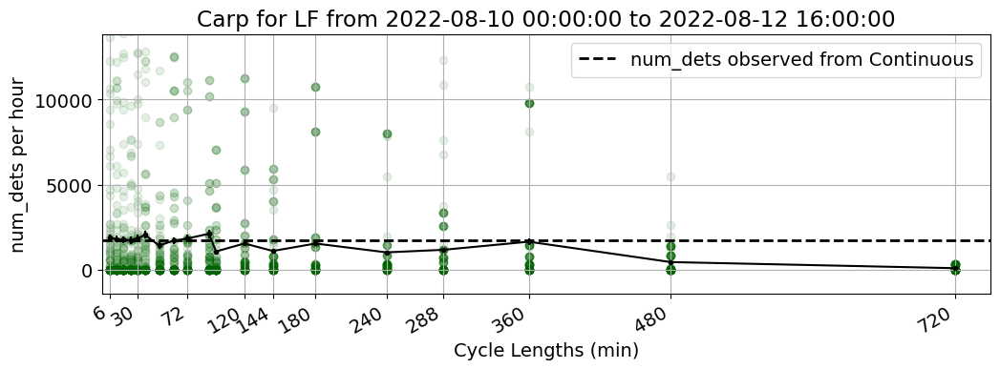

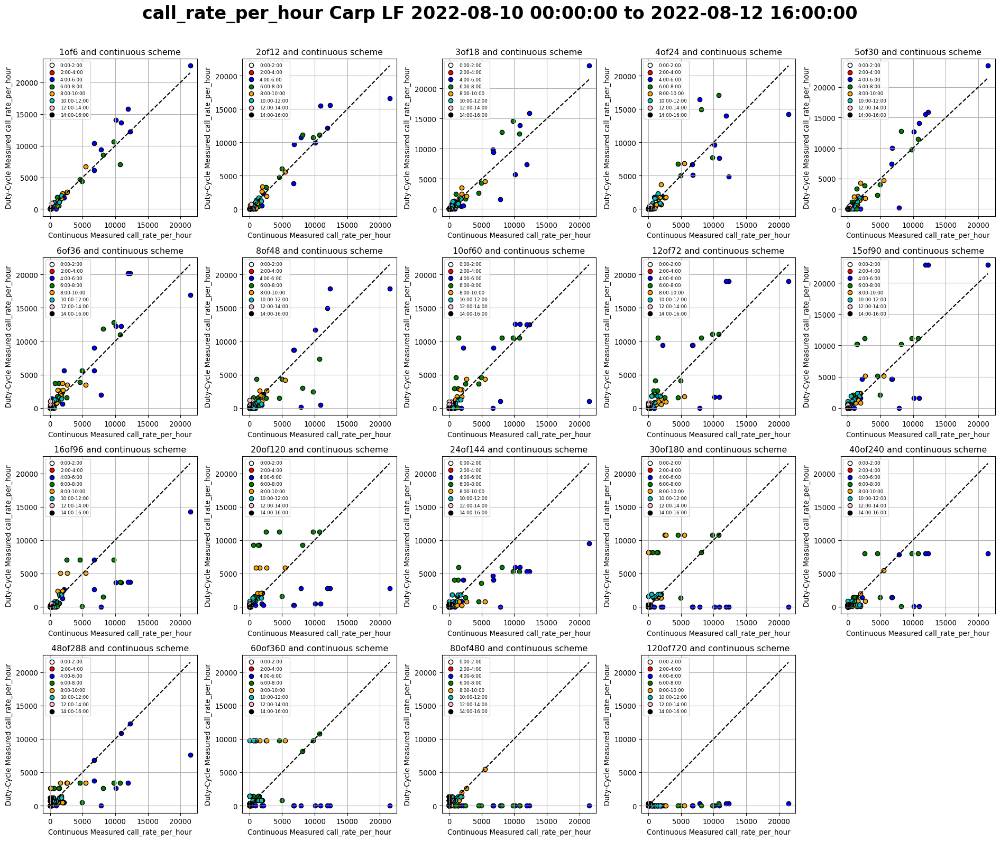

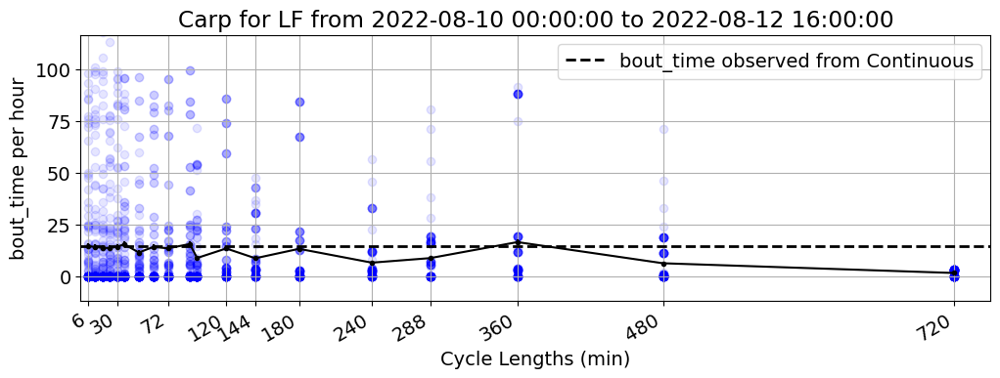

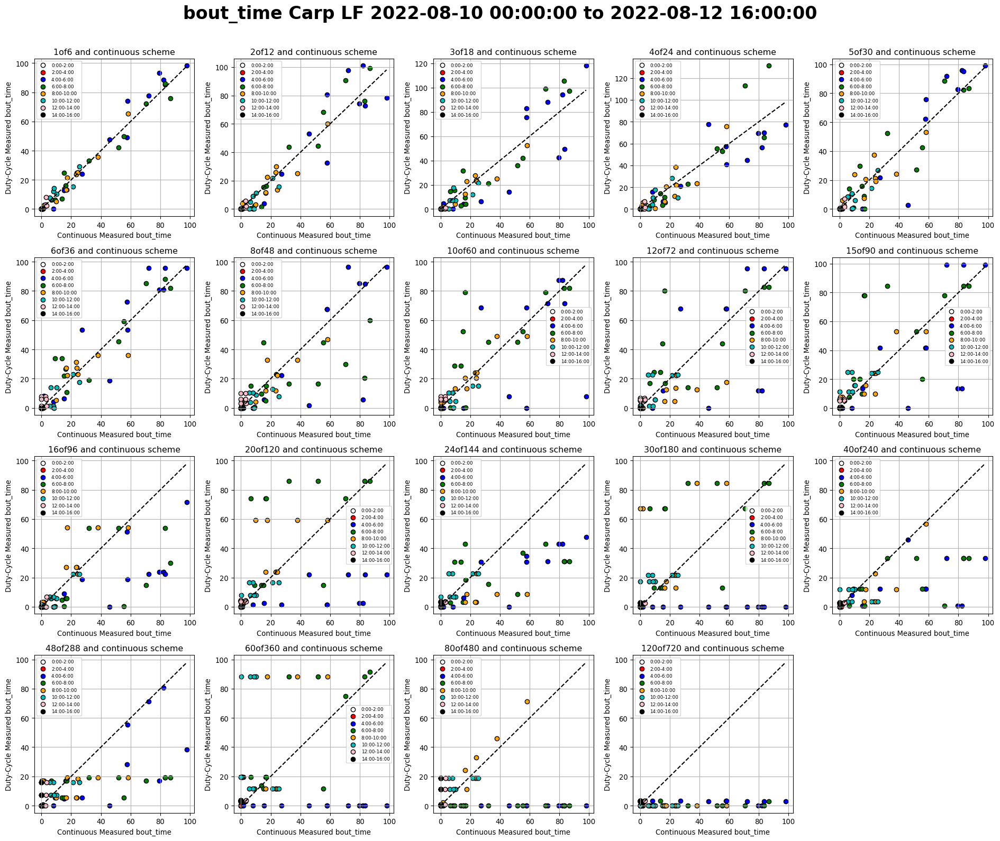

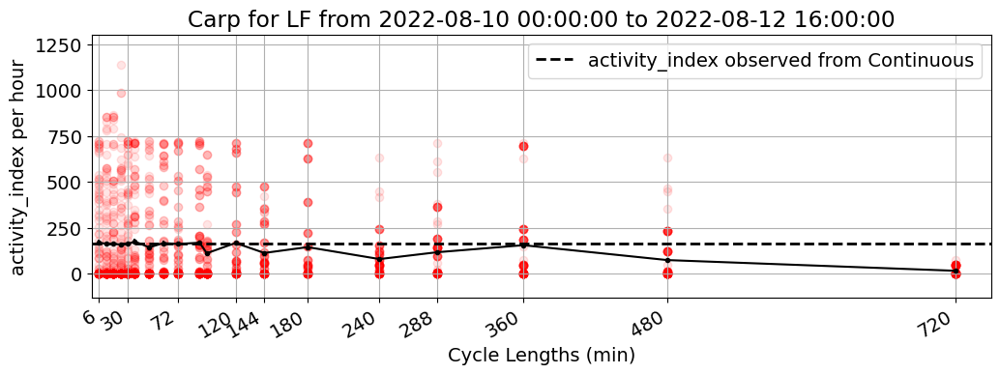

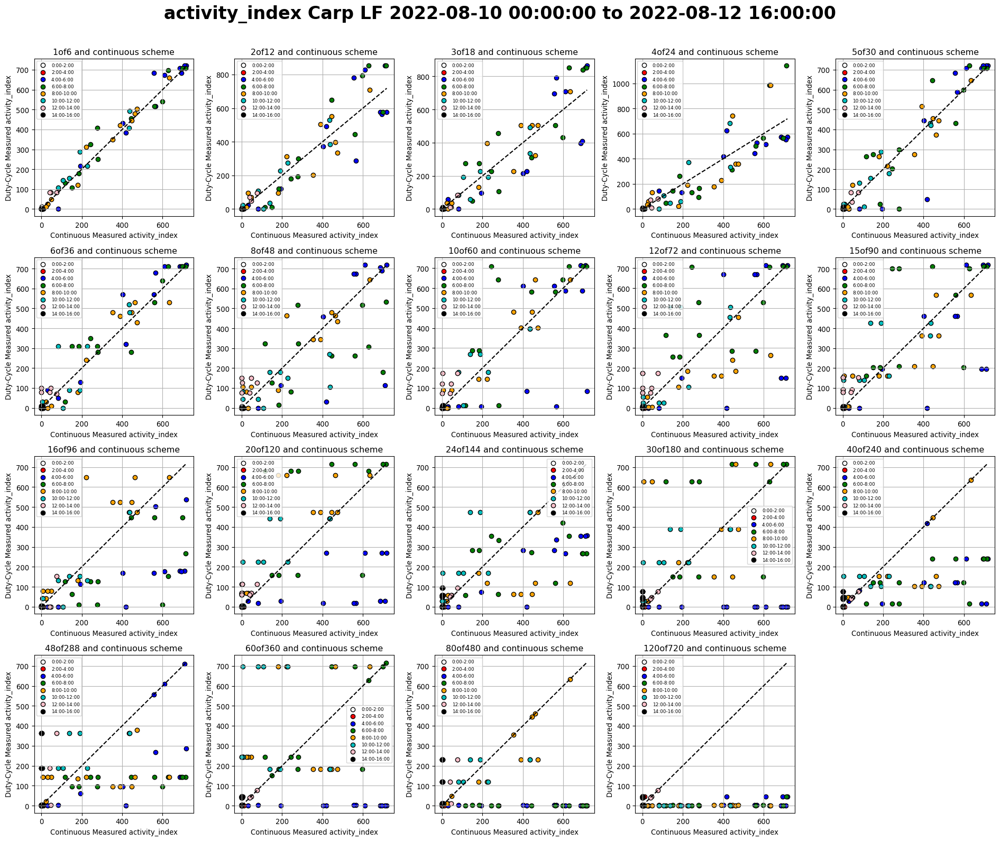

Carp HF


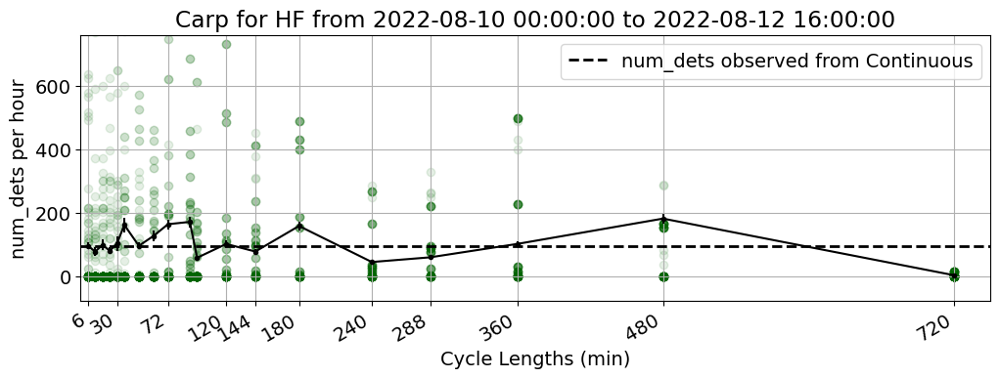

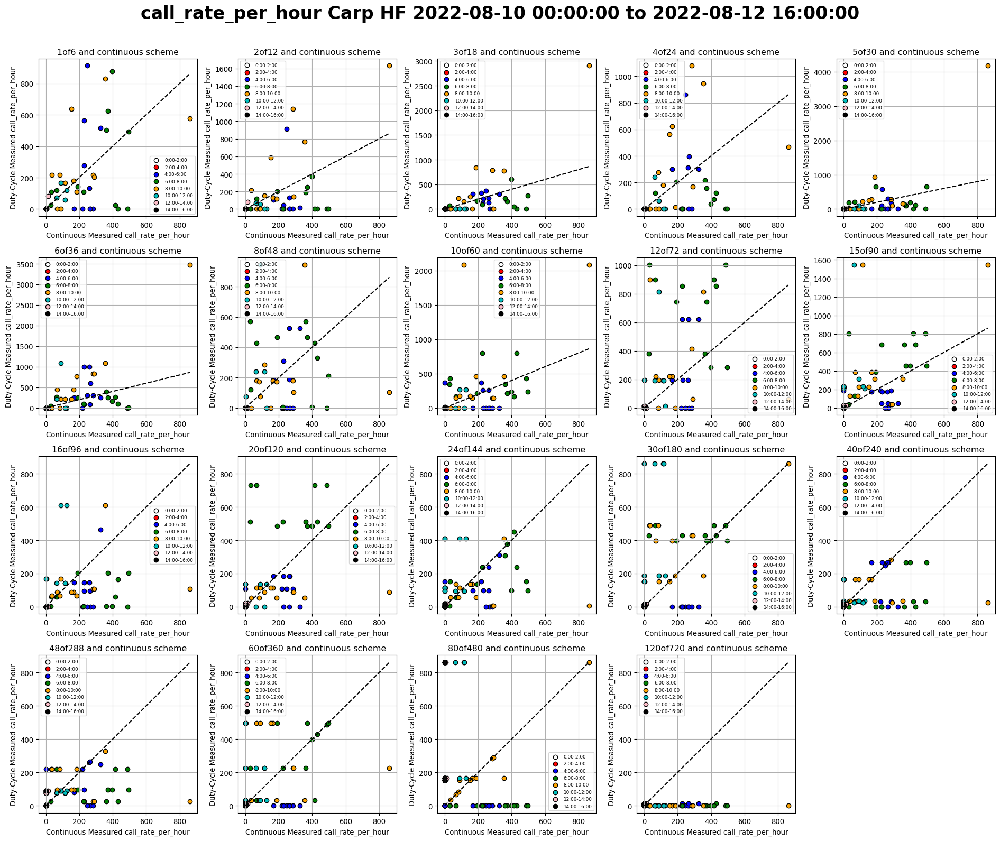

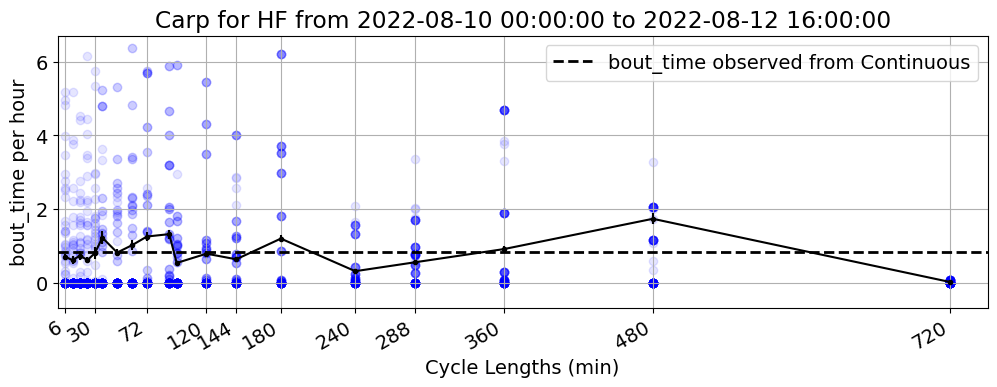

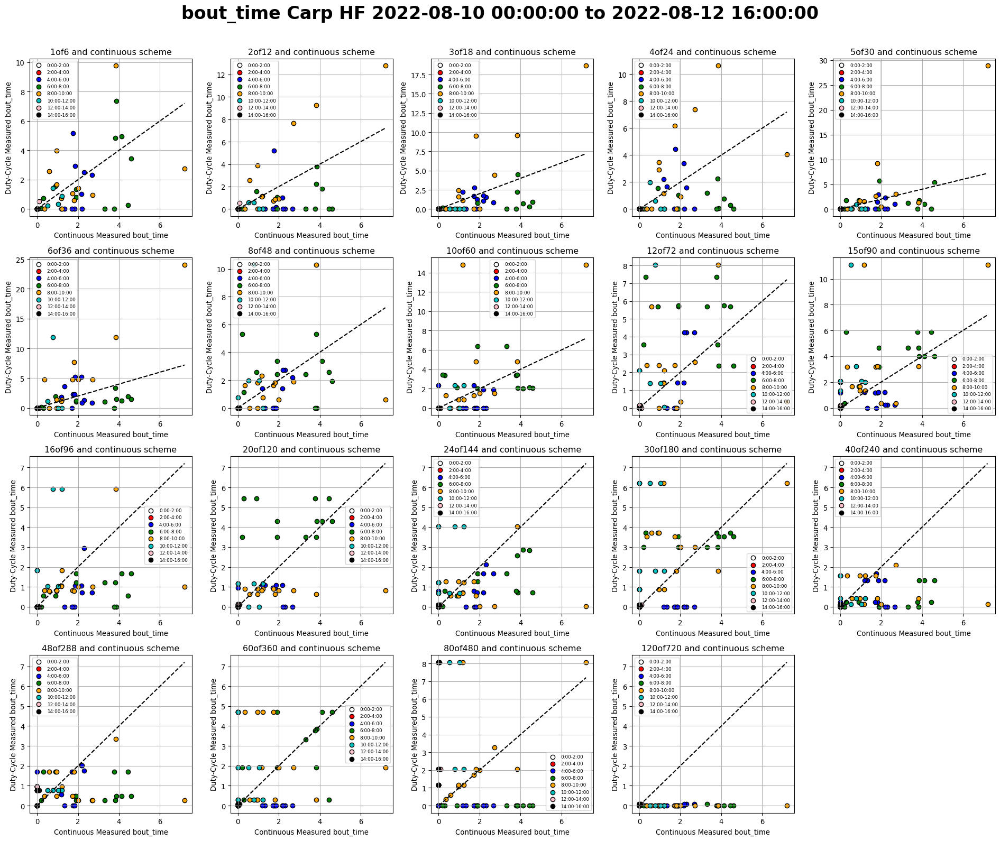

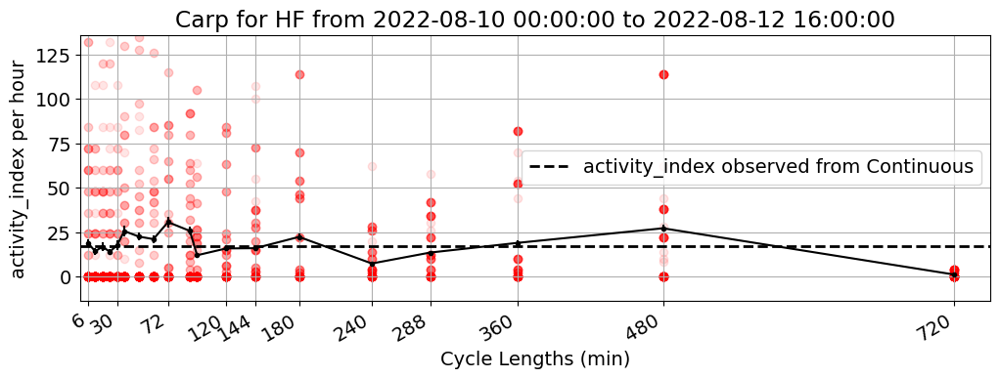

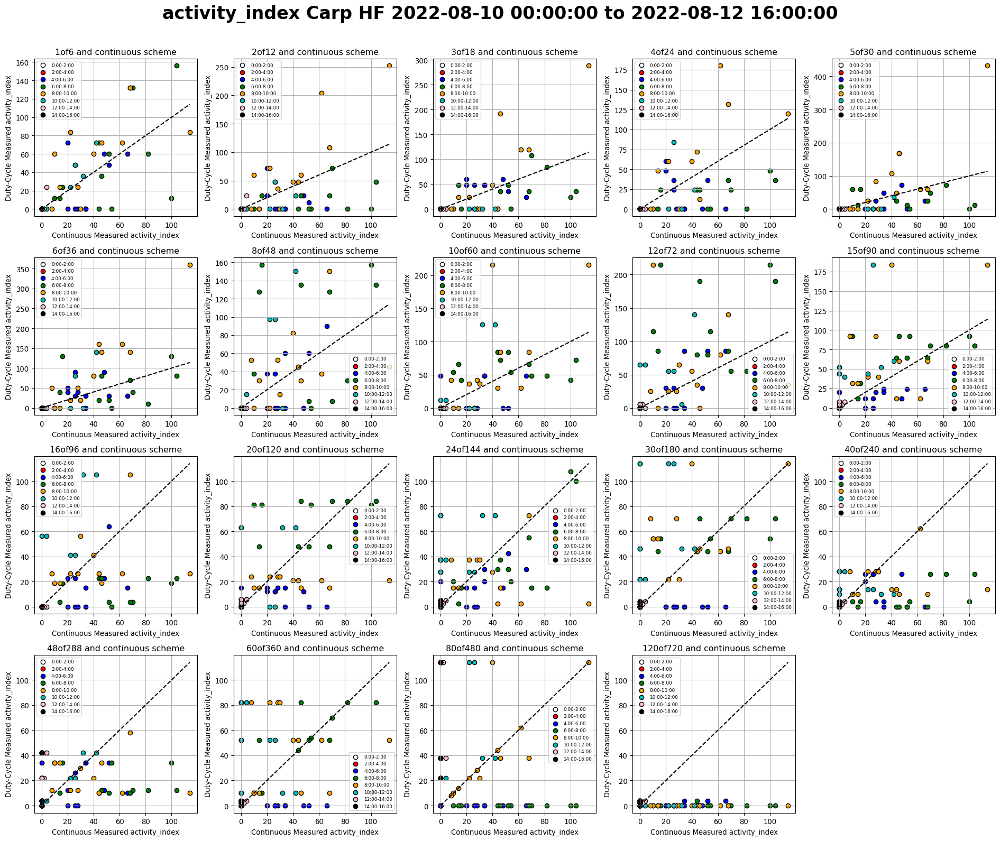

In [8]:
site_key = 'Carp'
type_keys = ['LF', 'HF']
data_params['bin_size'] = '30'
data_params["dc_tags"] = dc_tags
data_params["site_tag"] = site_key
data_params['cur_dc_tag'] = '30of30'
data_params["site_name"] = SITE_NAMES[site_key]

for type_key in type_keys:
    print(site_key, type_key)
    data_params["type_tag"] = type_key

    file_paths = get_file_paths(data_params)
    data_params['metric_tag'] = 'num_dets'
    activity_dets_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_dets_TYPE_SITE_summary"]}.csv', index_col=0)
    activity_dets_arr.index = pd.DatetimeIndex(activity_dets_arr.index)
    data_params['start'] = dt.datetime(2022, 8, 10, 0, 0, 0)
    data_params['end'] = dt.datetime(2022, 8, 12, 16, 0, 0)
    actvt_metric = activity_dets_arr.loc[data_params['start']:data_params['end']].copy()
    metrics = get_desired_metrics_from_activity_section(actvt_metric, data_params)
    plot_metric_over_cycle_lengths(metrics, data_params)
    plot_metric_subplot_correlation(metrics)

    data_params['metric_tag'] = 'bout_time'
    activity_bout_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_bouts_TYPE_SITE_summary"]}.csv', index_col=0)
    activity_bout_arr.index = pd.DatetimeIndex(activity_bout_arr.index)
    actvt_metric = activity_bout_arr.loc[data_params['start']:data_params['end']].copy()
    metrics = get_desired_metrics_from_activity_section(actvt_metric, data_params)
    plot_metric_over_cycle_lengths(metrics, data_params)
    plot_metric_subplot_correlation(metrics)

    data_params['metric_tag'] = 'activity_index'
    activity_inds_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_inds_TYPE_SITE_summary"]}.csv', index_col=0)
    activity_inds_arr.index = pd.DatetimeIndex(activity_inds_arr.index)
    actvt_metric = activity_inds_arr.loc[data_params['start']:data_params['end']].copy()
    metrics = get_desired_metrics_from_activity_section(actvt_metric, data_params)
    plot_metric_over_cycle_lengths(metrics, data_params)
    plot_metric_subplot_correlation(metrics)

Carp LF


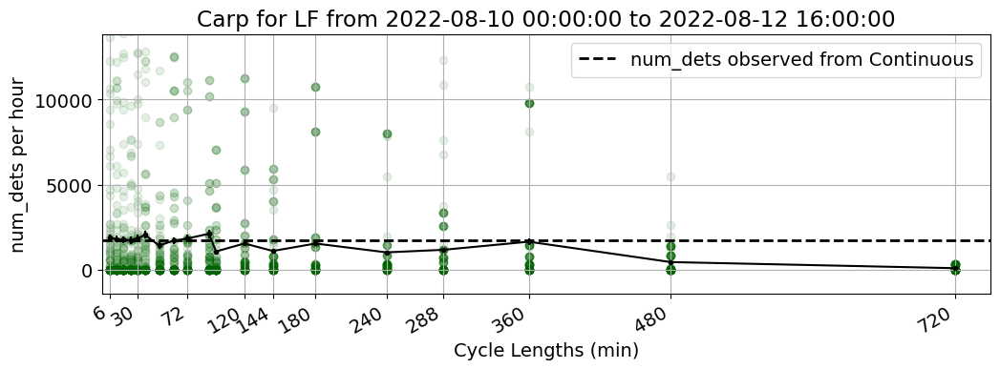

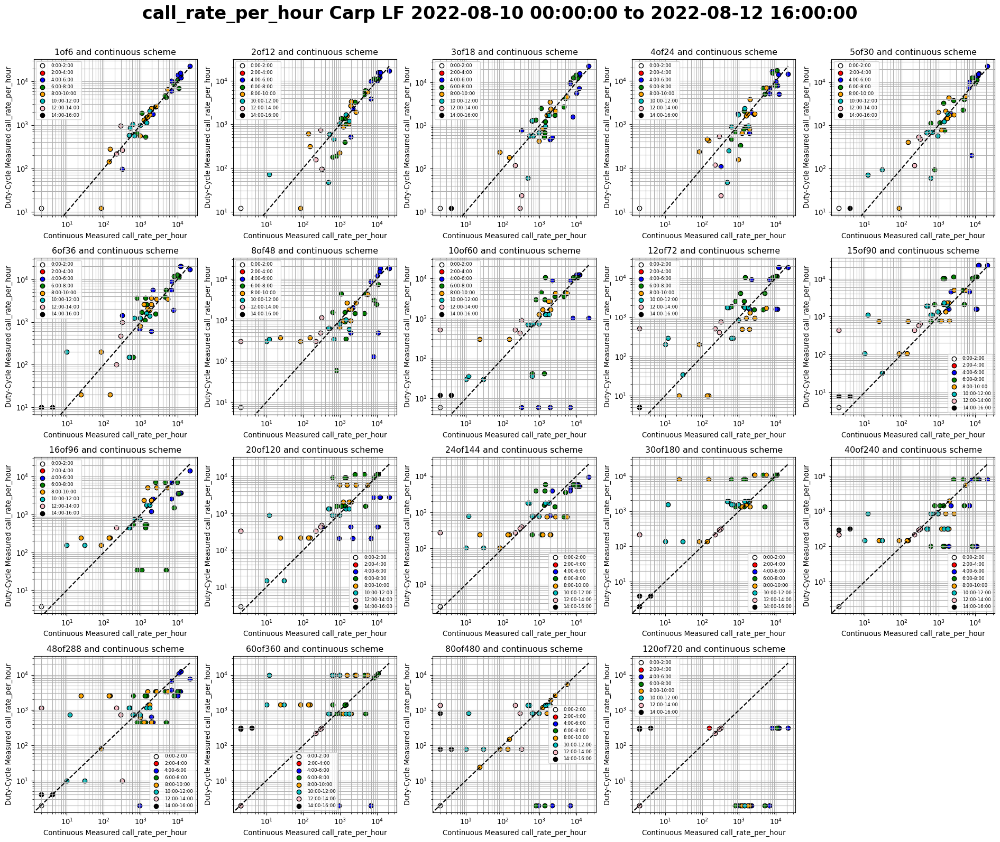

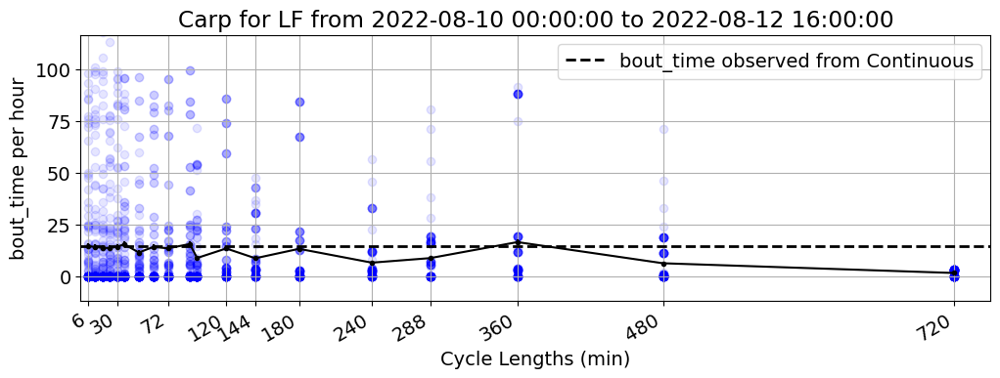

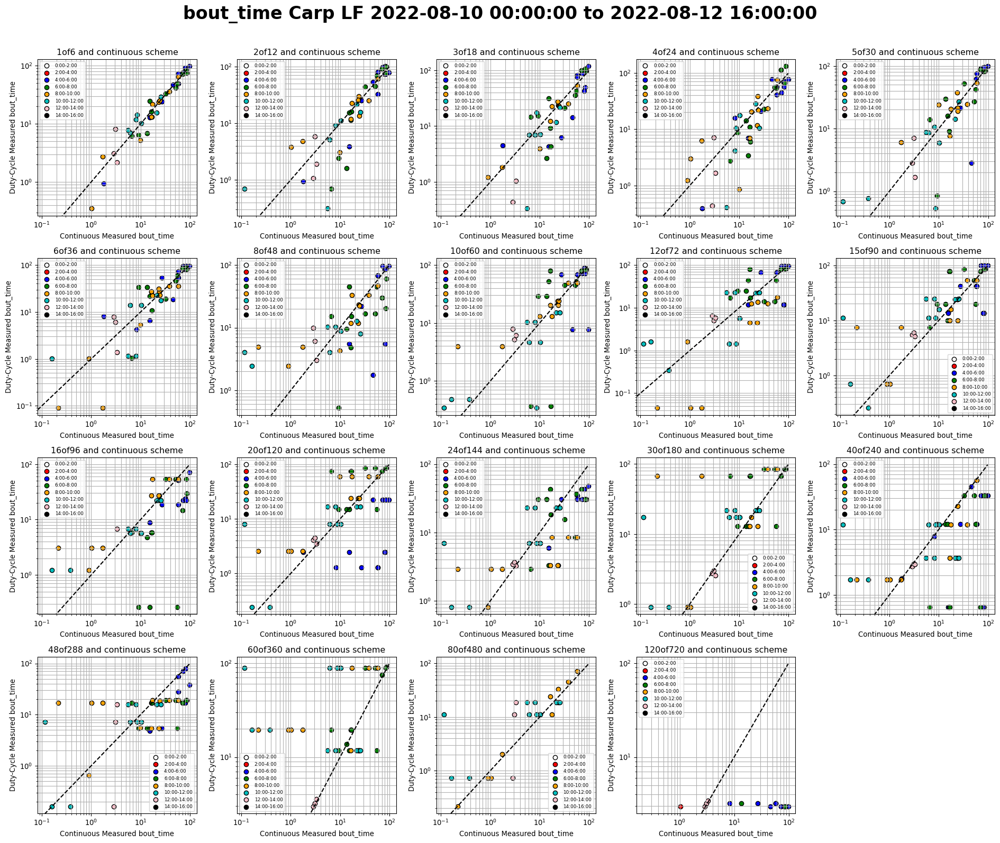

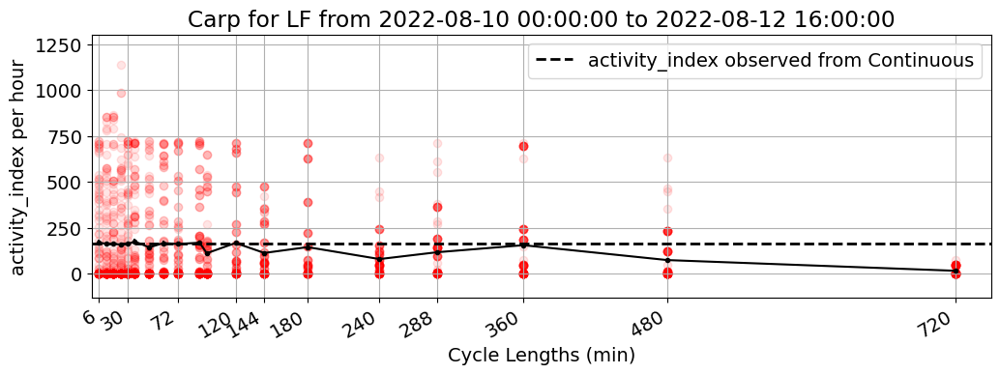

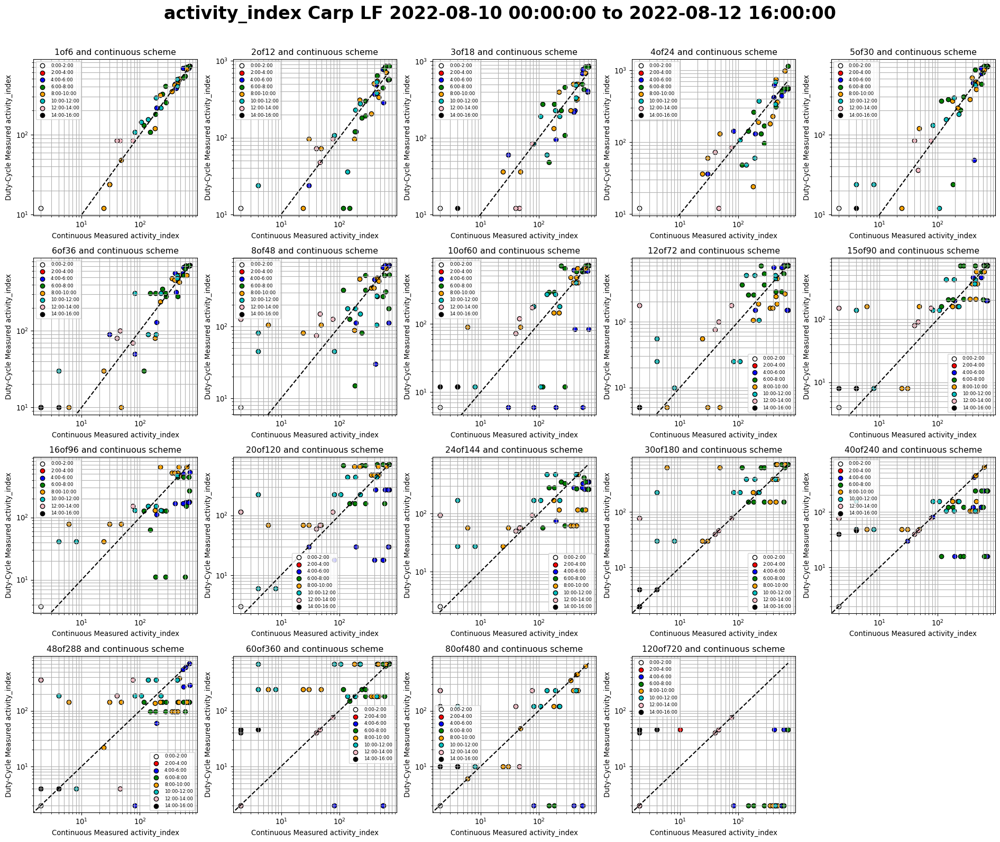

Carp HF


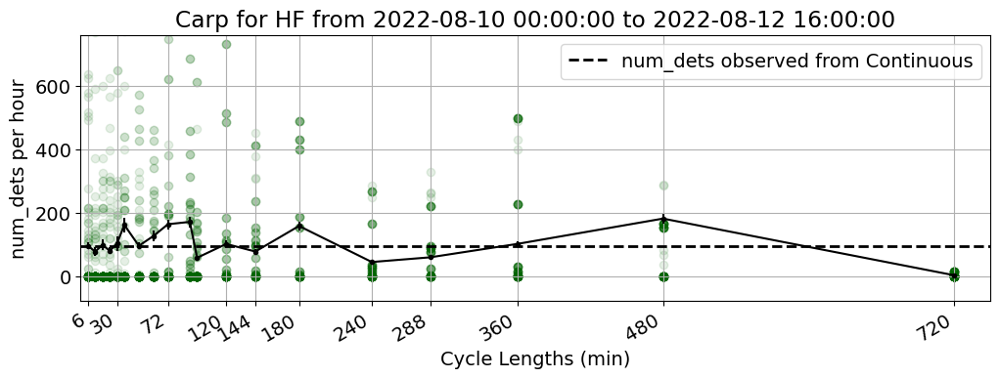

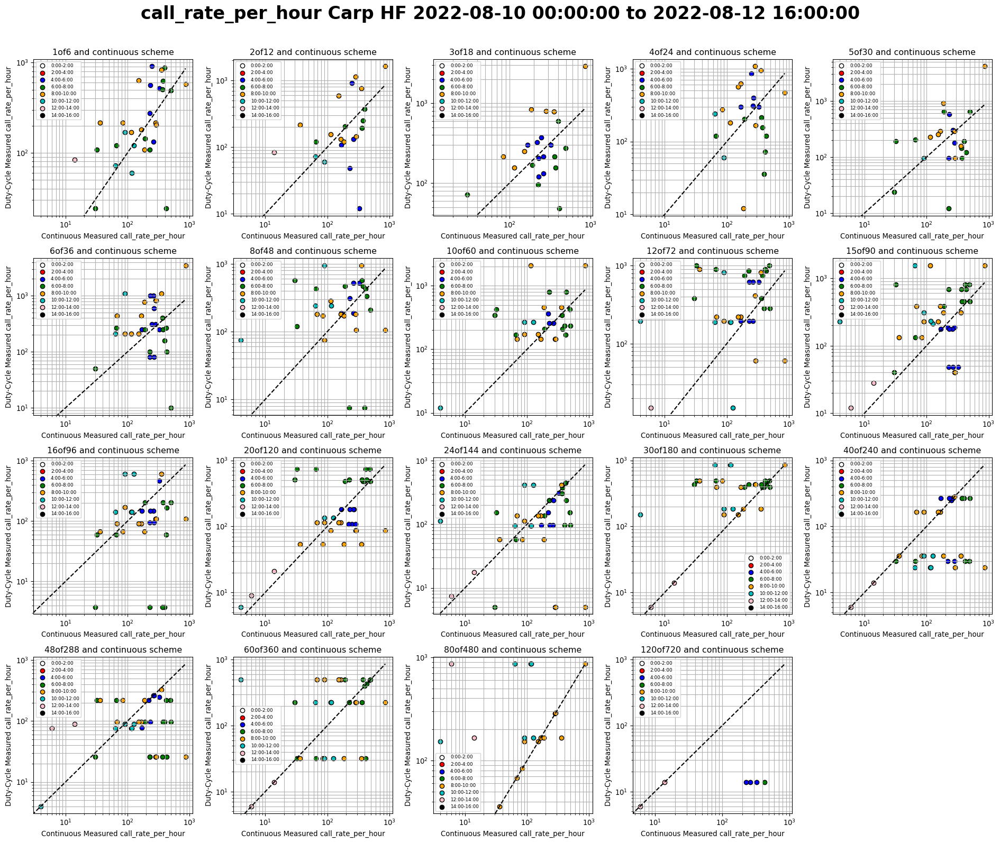

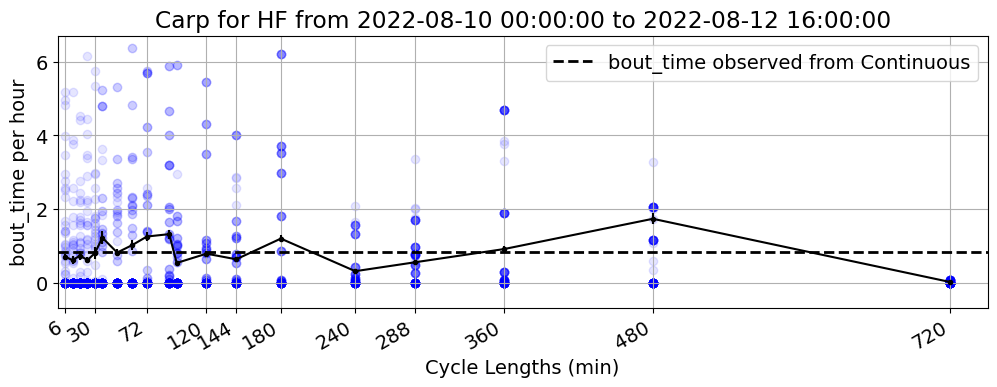

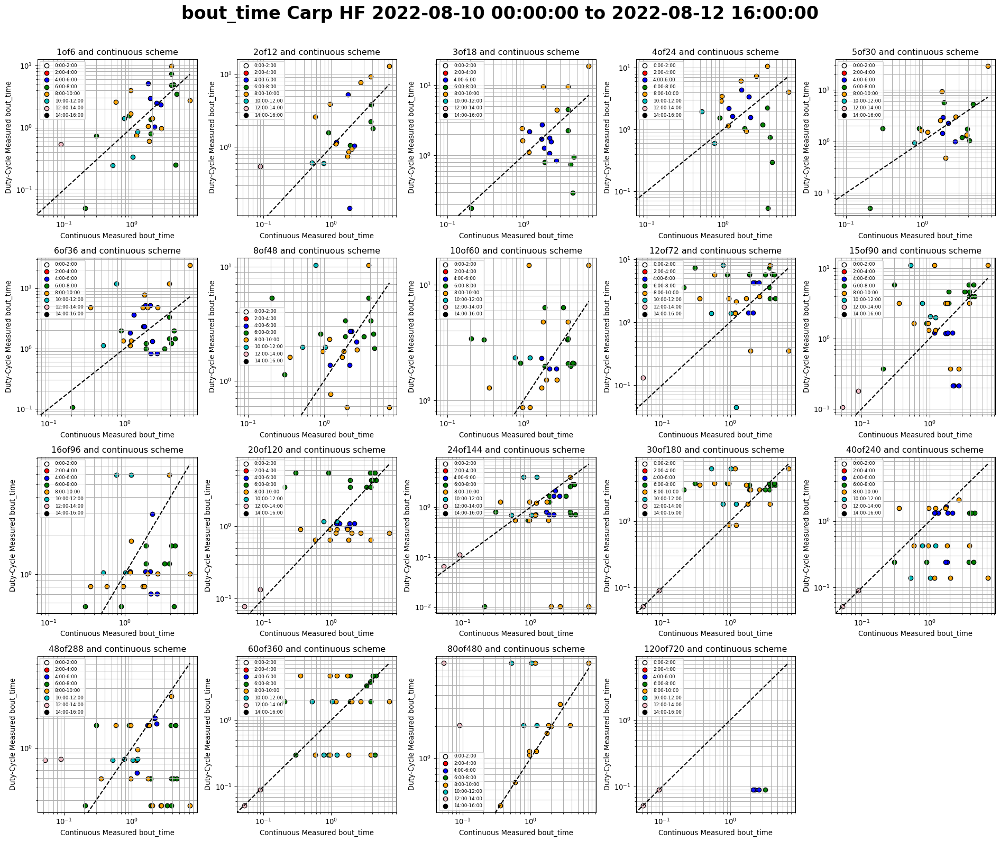

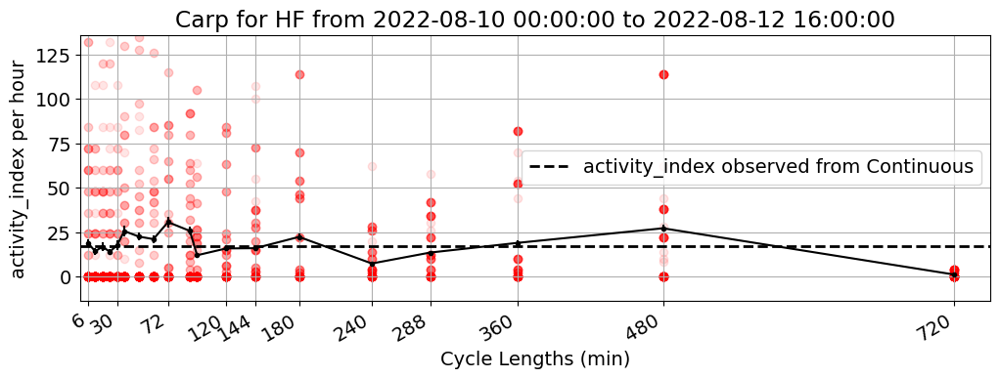

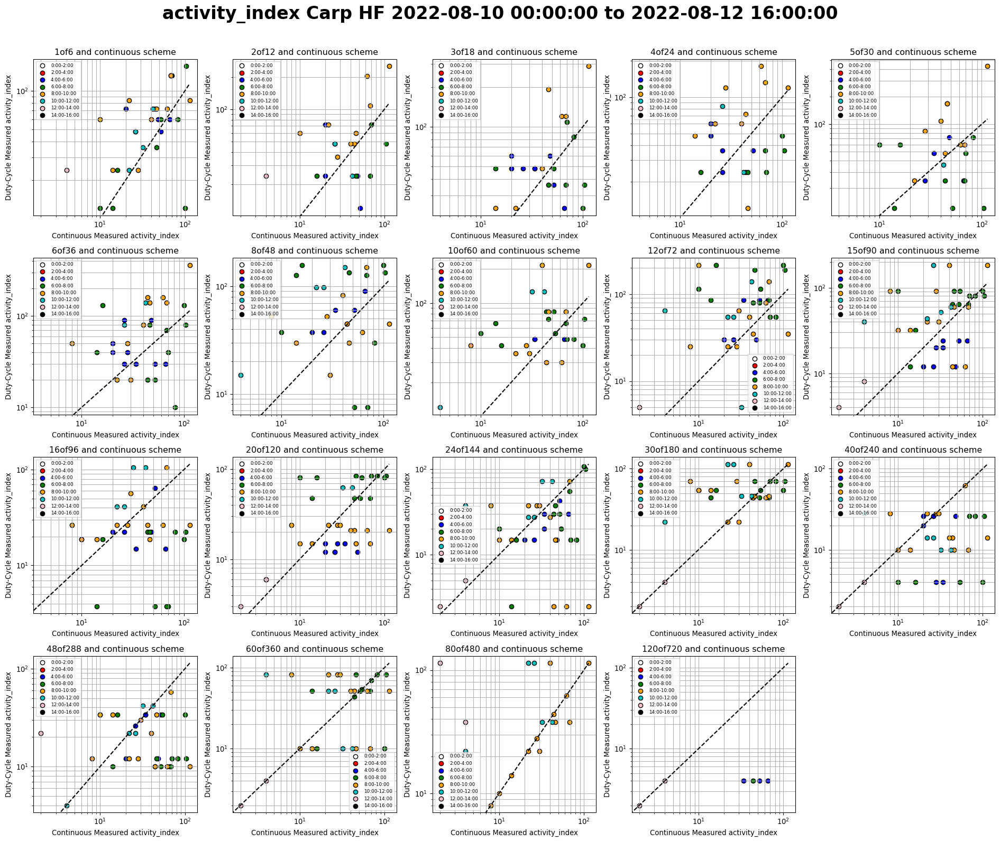

In [15]:
site_key = 'Carp'
type_keys = ['LF', 'HF']
data_params['bin_size'] = '30'
data_params["dc_tags"] = dc_tags
data_params["site_tag"] = site_key
data_params['cur_dc_tag'] = '30of30'
data_params["site_name"] = SITE_NAMES[site_key]

for type_key in type_keys:
    print(site_key, type_key)
    data_params["type_tag"] = type_key

    file_paths = get_file_paths(data_params)
    data_params['metric_tag'] = 'num_dets'
    activity_dets_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_dets_TYPE_SITE_summary"]}.csv', index_col=0)
    activity_dets_arr.index = pd.DatetimeIndex(activity_dets_arr.index)
    data_params['start'] = dt.datetime(2022, 8, 10, 0, 0, 0)
    data_params['end'] = dt.datetime(2022, 8, 12, 16, 0, 0)
    actvt_metric = activity_dets_arr.loc[data_params['start']:data_params['end']].copy()
    metrics = get_desired_metrics_from_activity_section(actvt_metric, data_params)
    plot_metric_over_cycle_lengths(metrics, data_params)
    plot_metric_subplot_correlation(metrics)

    data_params['metric_tag'] = 'bout_time'
    activity_bout_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_bouts_TYPE_SITE_summary"]}.csv', index_col=0)
    activity_bout_arr.index = pd.DatetimeIndex(activity_bout_arr.index)
    actvt_metric = activity_bout_arr.loc[data_params['start']:data_params['end']].copy()
    metrics = get_desired_metrics_from_activity_section(actvt_metric, data_params)
    plot_metric_over_cycle_lengths(metrics, data_params)
    plot_metric_subplot_correlation(metrics)

    data_params['metric_tag'] = 'activity_index'
    activity_inds_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_inds_TYPE_SITE_summary"]}.csv', index_col=0)
    activity_inds_arr.index = pd.DatetimeIndex(activity_inds_arr.index)
    actvt_metric = activity_inds_arr.loc[data_params['start']:data_params['end']].copy()
    metrics = get_desired_metrics_from_activity_section(actvt_metric, data_params)
    plot_metric_over_cycle_lengths(metrics, data_params)
    plot_metric_subplot_correlation(metrics)

In [9]:
activity_dets_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_dets_TYPE_SITE_summary"]}.csv', index_col=0)
activity_dets_arr.index = pd.DatetimeIndex(activity_dets_arr.index)
actvt_metric = activity_dets_arr.loc[data_params['start']:data_params['end']].copy()
metr = pd.DataFrame(actvt_metric.iloc[:,0])
metr_p = pd.pivot_table(metr, index=(metr.index.time), 
                    columns=metr.index.date, 
                    values=metr.columns[0])
metr_p

,2022-08-10,2022-08-11,2022-08-12
00:00:00,0.0,0.0,0.0
00:30:00,0.0,0.0,0.0
01:00:00,0.0,0.0,0.0
01:30:00,0.0,0.0,0.0
02:00:00,0.0,0.0,0.0
02:30:00,0.0,0.0,0.0
03:00:00,0.0,0.0,0.0
03:30:00,0.0,0.0,0.0
04:00:00,134.0,124.0,0.0
04:30:00,84.0,142.0,163.0


Carp LF


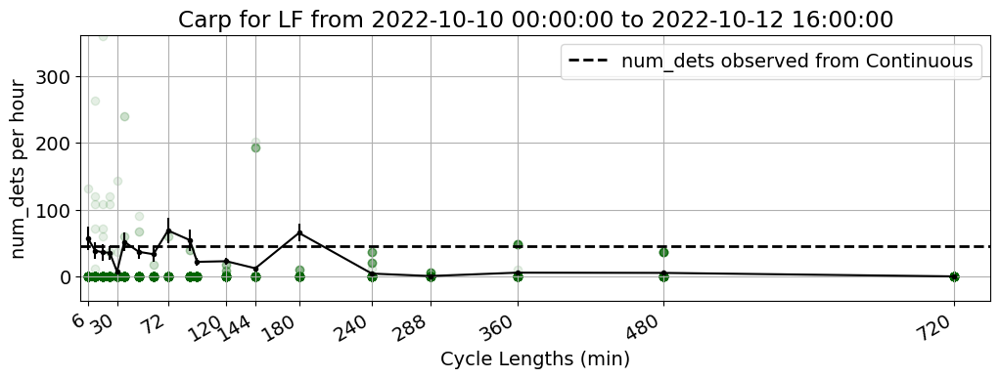

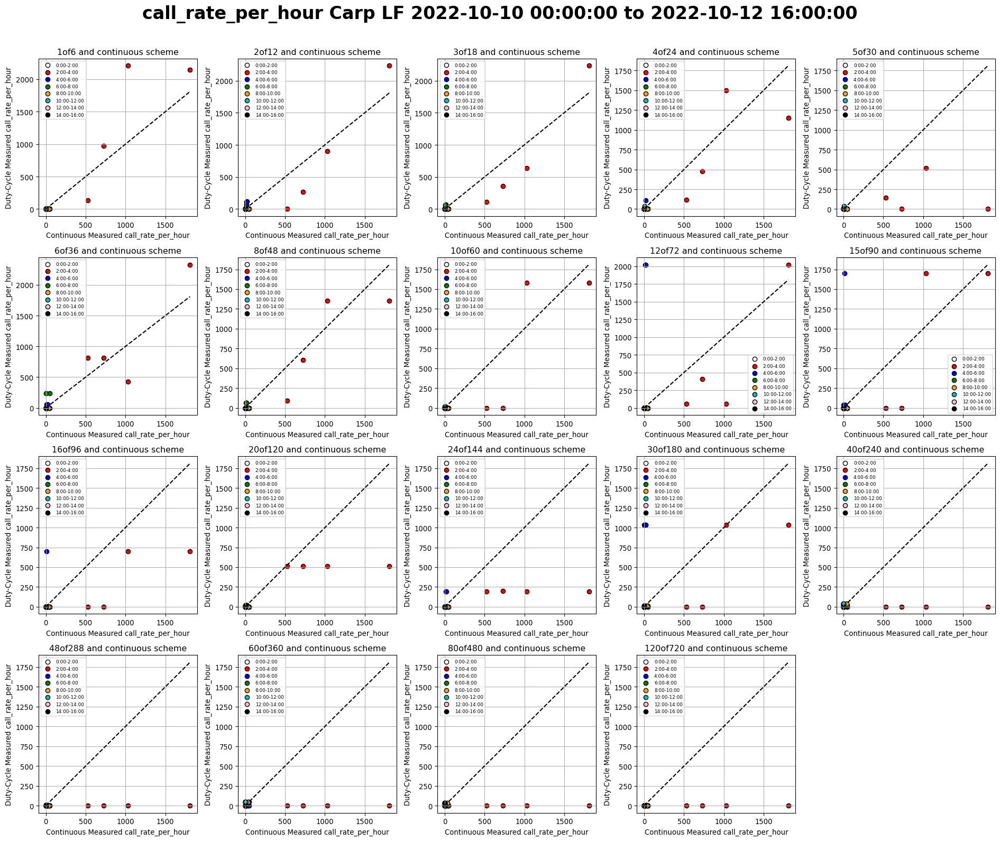

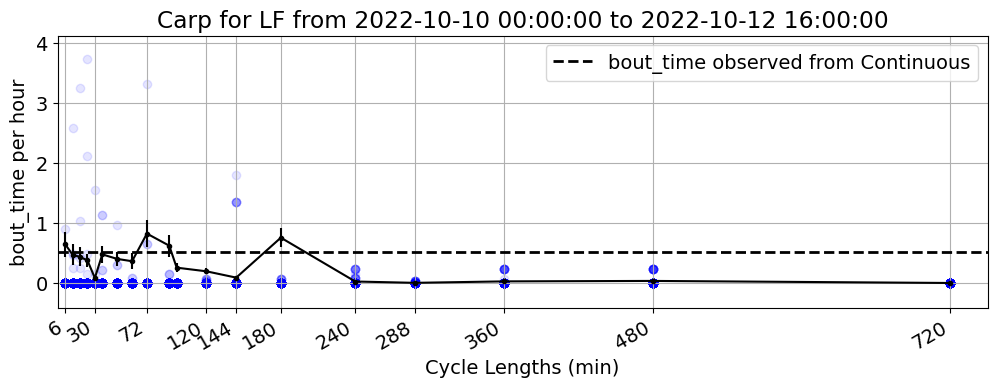

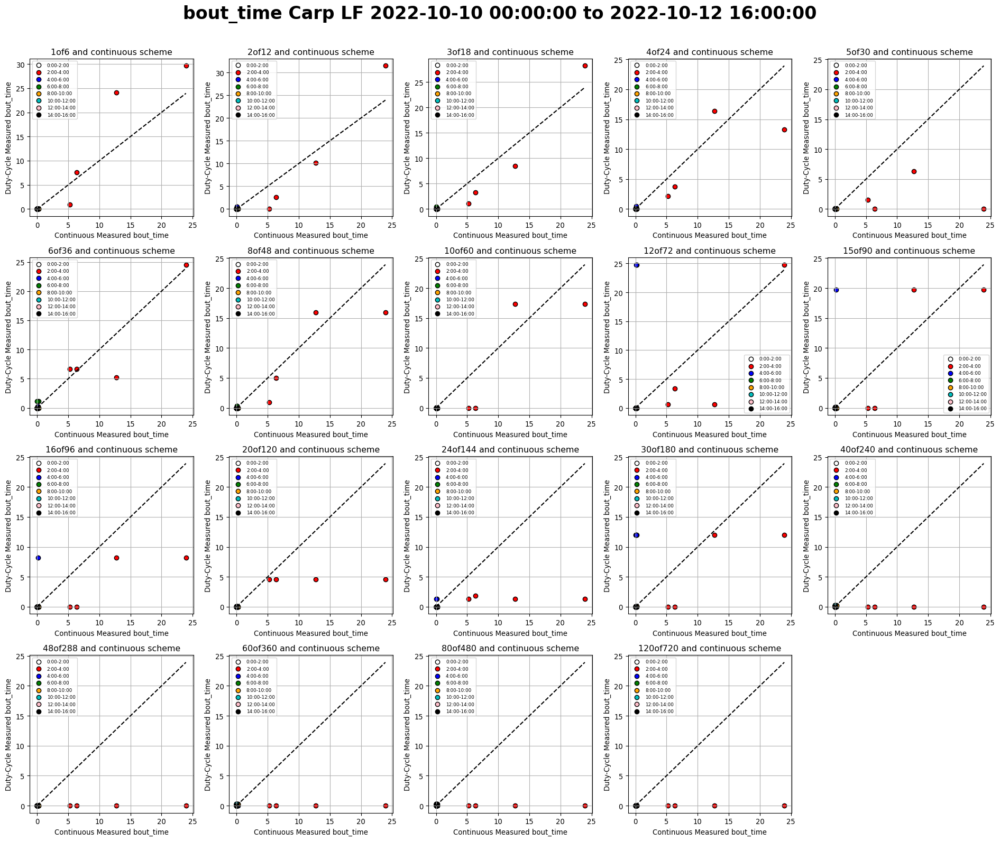

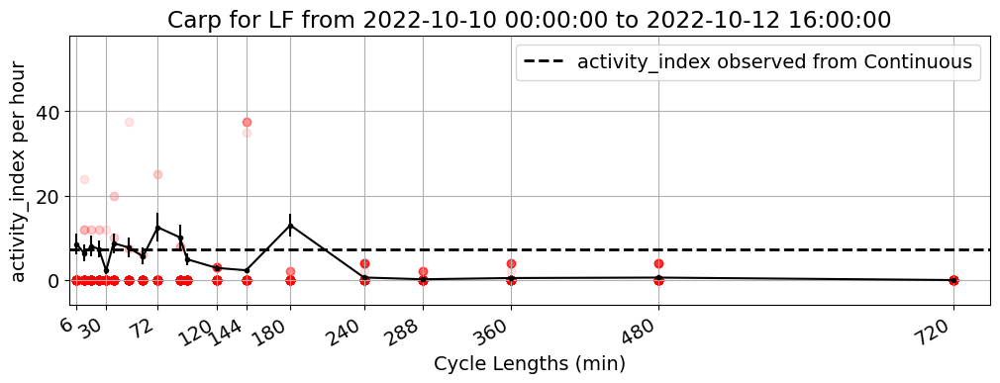

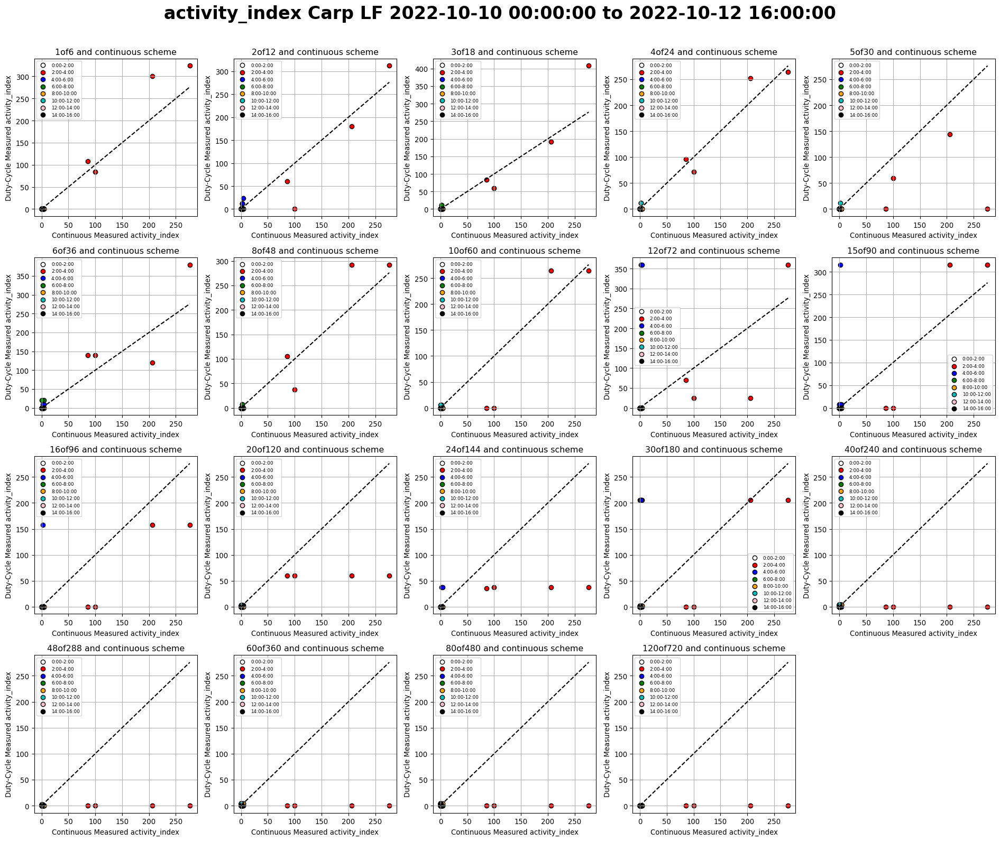

Carp HF


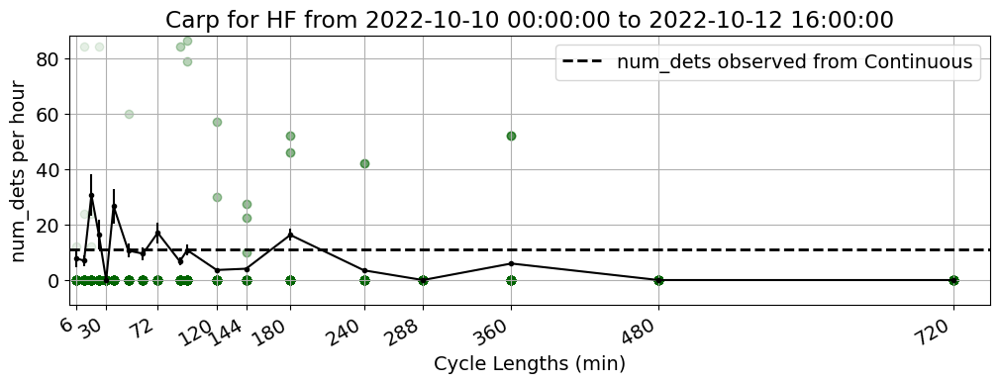

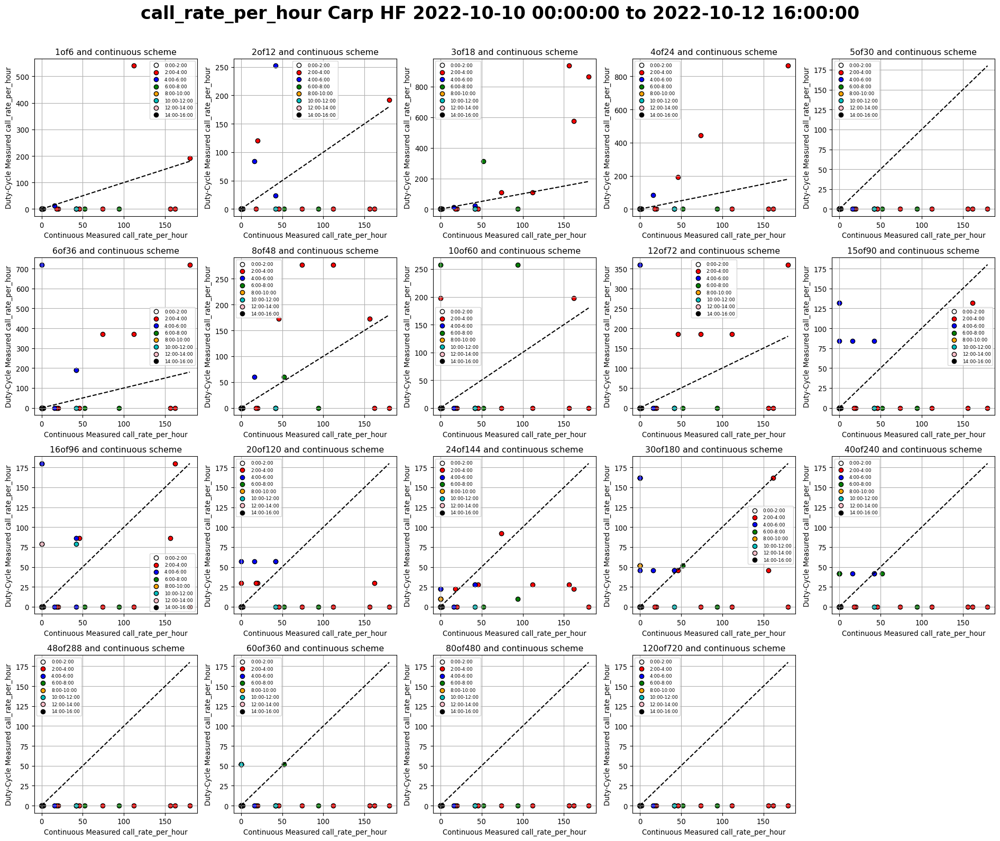

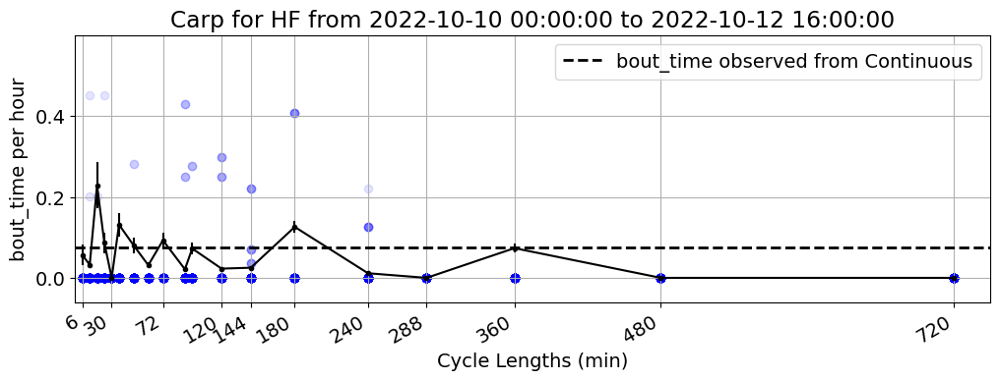

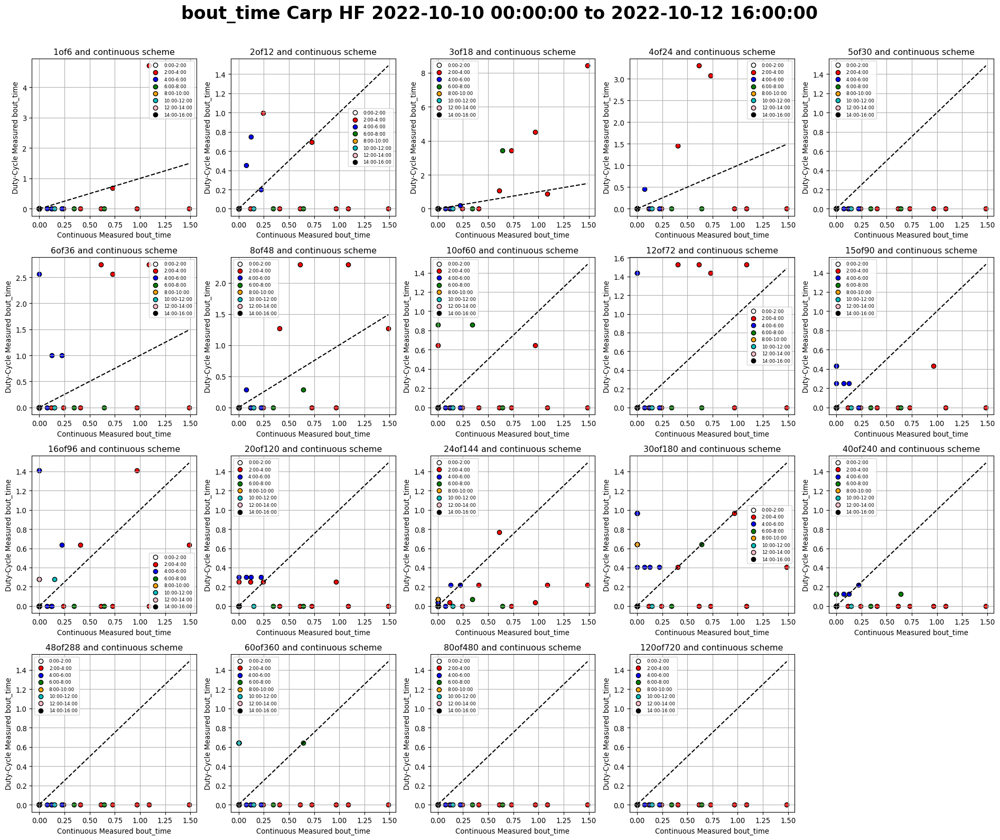

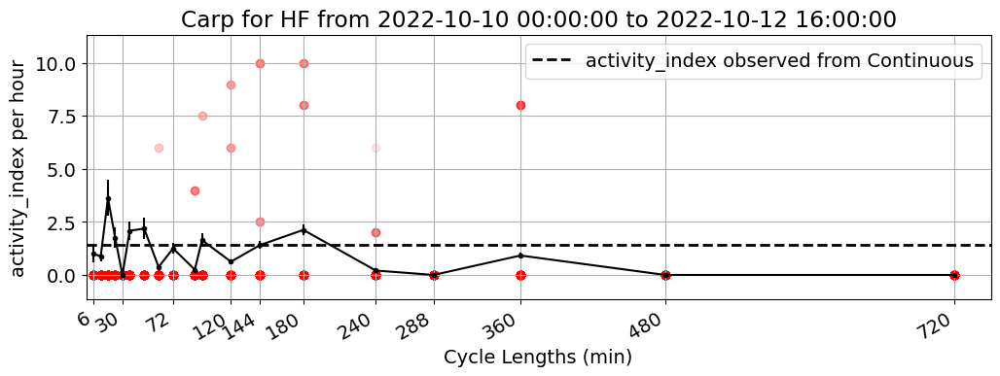

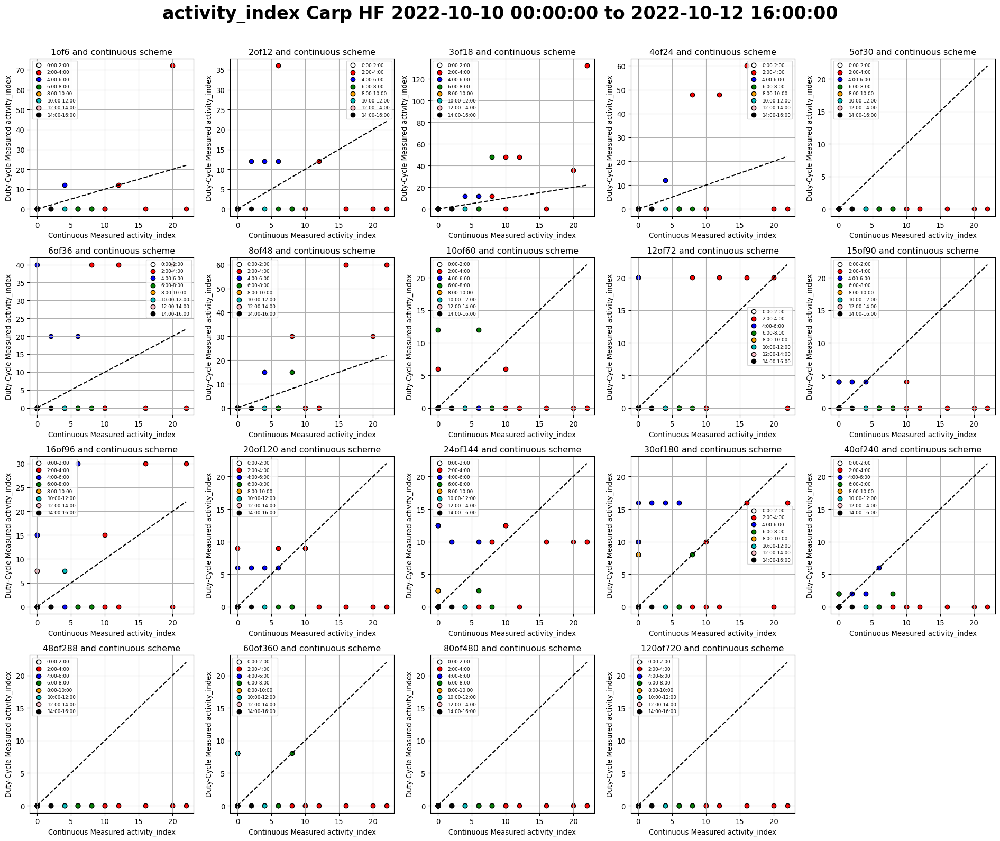

In [10]:
site_key = 'Carp'
type_keys = ['LF', 'HF']
data_params['bin_size'] = '30'
data_params["dc_tags"] = dc_tags
data_params["site_tag"] = site_key
data_params['cur_dc_tag'] = '30of30'
data_params["site_name"] = SITE_NAMES[site_key]

for type_key in type_keys:
    print(site_key, type_key)
    data_params["type_tag"] = type_key

    file_paths = get_file_paths(data_params)
    data_params['metric_tag'] = 'num_dets'
    activity_dets_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_dets_TYPE_SITE_summary"]}.csv', index_col=0)
    activity_dets_arr.index = pd.DatetimeIndex(activity_dets_arr.index)
    data_params['start'] = dt.datetime(2022, 10, 10, 0, 0, 0)
    data_params['end'] = dt.datetime(2022, 10, 12, 16, 0, 0)
    actvt_metric = activity_dets_arr.loc[data_params['start']:data_params['end']].copy()
    metrics = get_desired_metrics_from_activity_section(actvt_metric, data_params)
    # test = pd.DataFrame(metrics['control_metric'])
    # dc_metr1 = pd.pivot_table(test, index=(test.index.time), 
    #                             columns=test.index.date, 
    #                             values=test.columns[0])
    # dc_metr1
    plot_metric_over_cycle_lengths(metrics, data_params)
    plot_metric_subplot_correlation(metrics)

    data_params['metric_tag'] = 'bout_time'
    activity_bout_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_bouts_TYPE_SITE_summary"]}.csv', index_col=0)
    activity_bout_arr.index = pd.DatetimeIndex(activity_bout_arr.index)
    actvt_metric = activity_bout_arr.loc[data_params['start']:data_params['end']].copy()
    metrics = get_desired_metrics_from_activity_section(actvt_metric, data_params)
    plot_metric_over_cycle_lengths(metrics, data_params)
    plot_metric_subplot_correlation(metrics)

    data_params['metric_tag'] = 'activity_index'
    activity_inds_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_inds_TYPE_SITE_summary"]}.csv', index_col=0)
    activity_inds_arr.index = pd.DatetimeIndex(activity_inds_arr.index)
    actvt_metric = activity_inds_arr.loc[data_params['start']:data_params['end']].copy()
    metrics = get_desired_metrics_from_activity_section(actvt_metric, data_params)
    plot_metric_over_cycle_lengths(metrics, data_params)
    plot_metric_subplot_correlation(metrics)

In [11]:
activity_dets_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_dets_TYPE_SITE_summary"]}.csv', index_col=0)
activity_dets_arr.index = pd.DatetimeIndex(activity_dets_arr.index)
actvt_metric = activity_dets_arr.loc[data_params['start']:data_params['end']].copy()
metr = pd.DataFrame(actvt_metric.iloc[:,0])
metr_p = pd.pivot_table(metr, index=(metr.index.time), 
                    columns=metr.index.date, 
                    values=metr.columns[0])
metr_p

,2022-10-10,2022-10-11,2022-10-12
00:00:00,0.0,0.0,0.0
00:30:00,0.0,0.0,0.0
01:00:00,0.0,0.0,0.0
01:30:00,0.0,0.0,0.0
02:00:00,37.0,10.0,0.0
02:30:00,56.0,9.0,0.0
03:00:00,23.0,81.0,0.0
03:30:00,78.0,0.0,90.0
04:00:00,21.0,0.0,0.0
04:30:00,21.0,0.0,0.0


Telephone LF


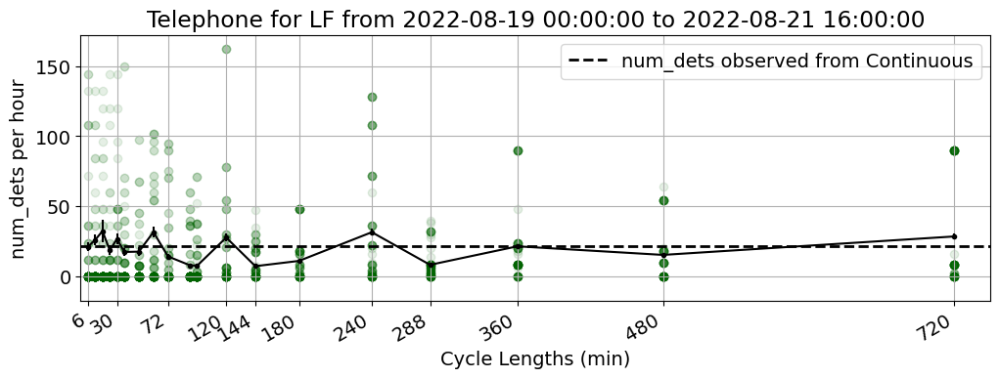

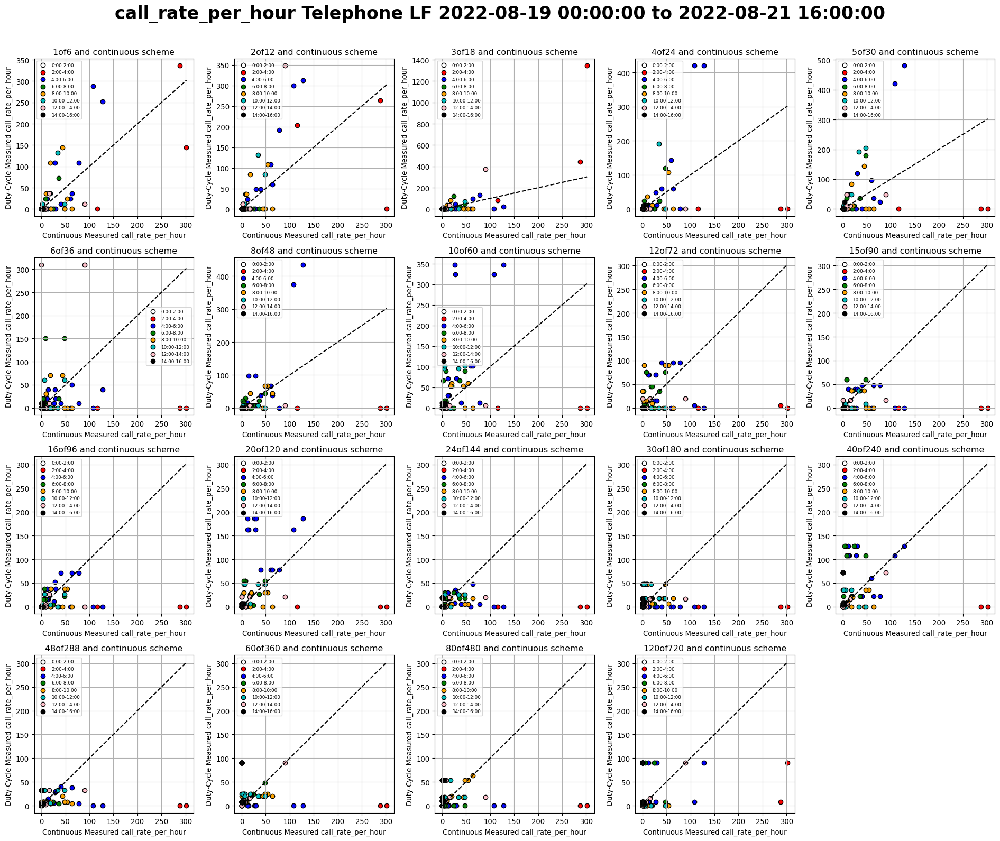

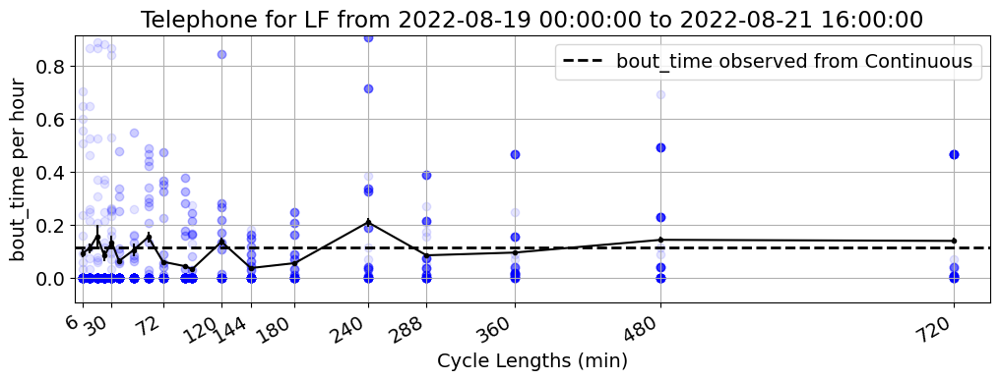

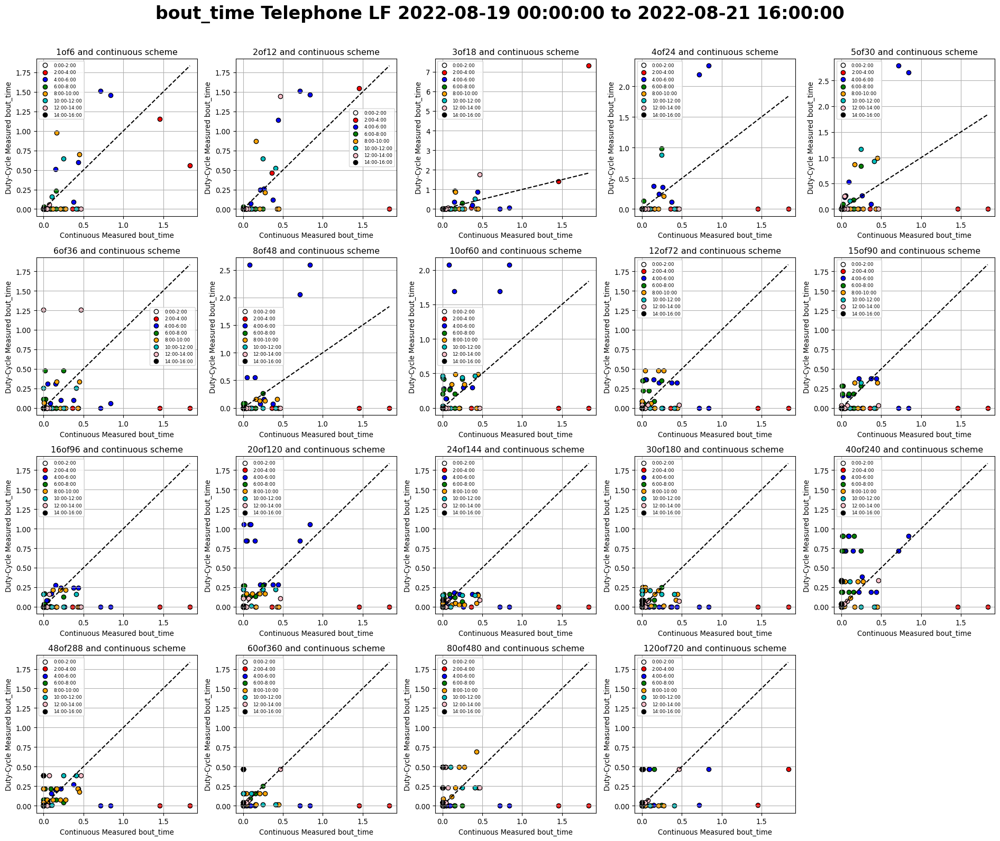

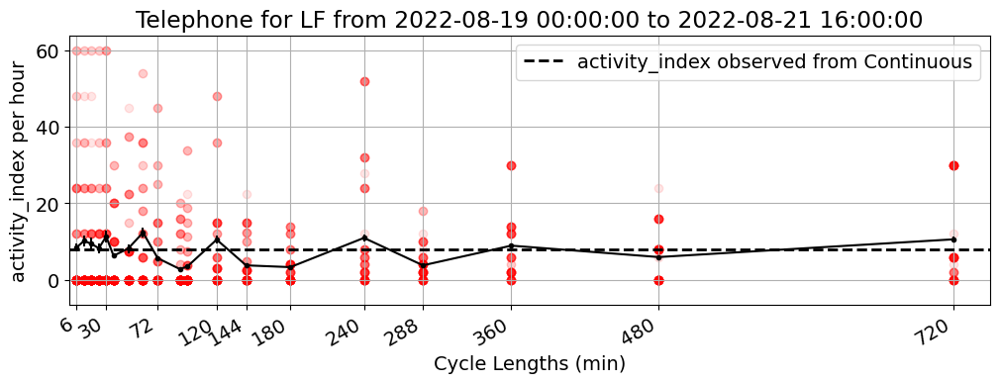

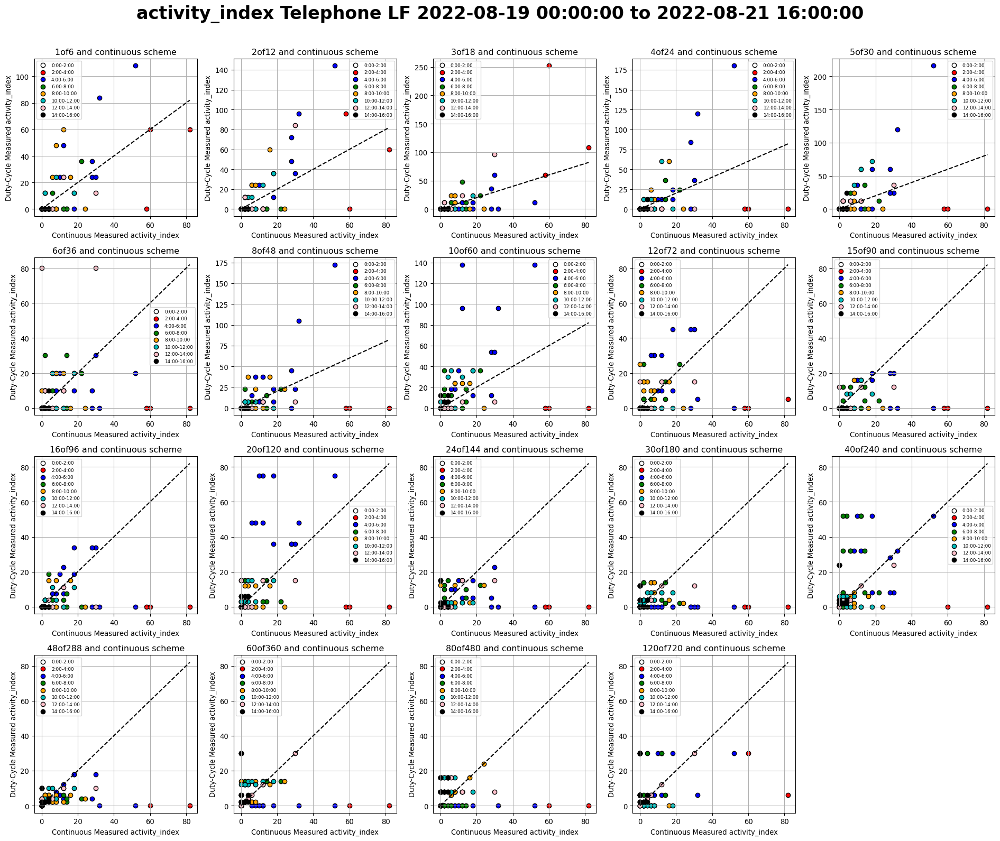

Telephone HF


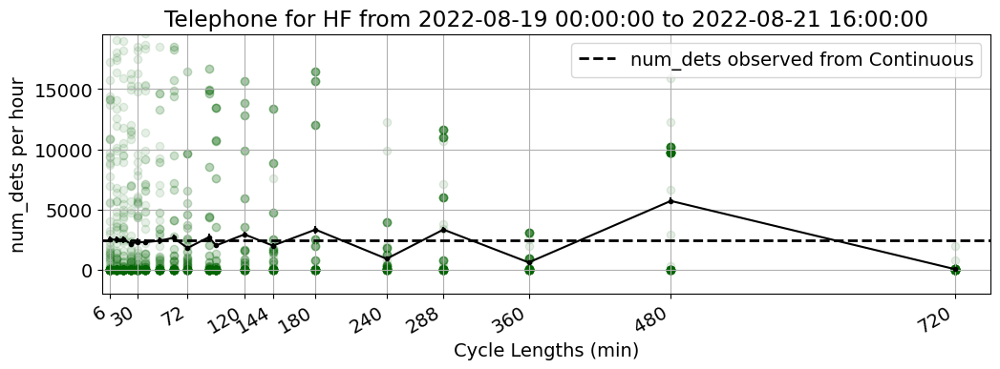

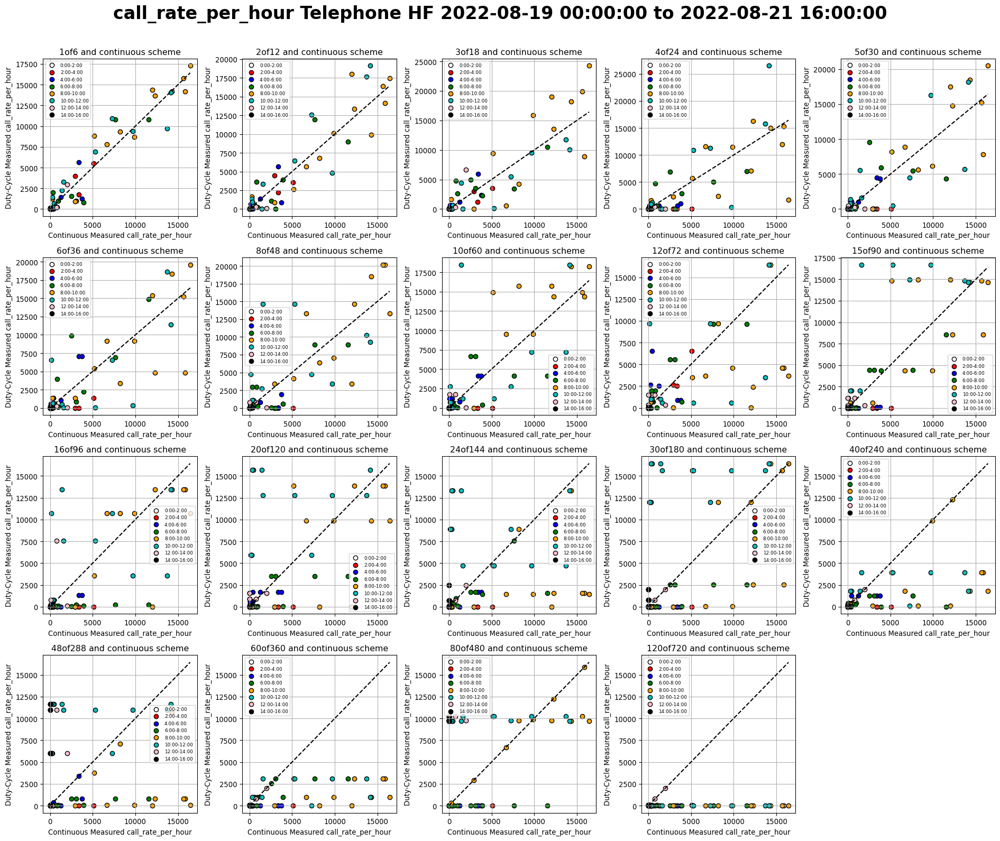

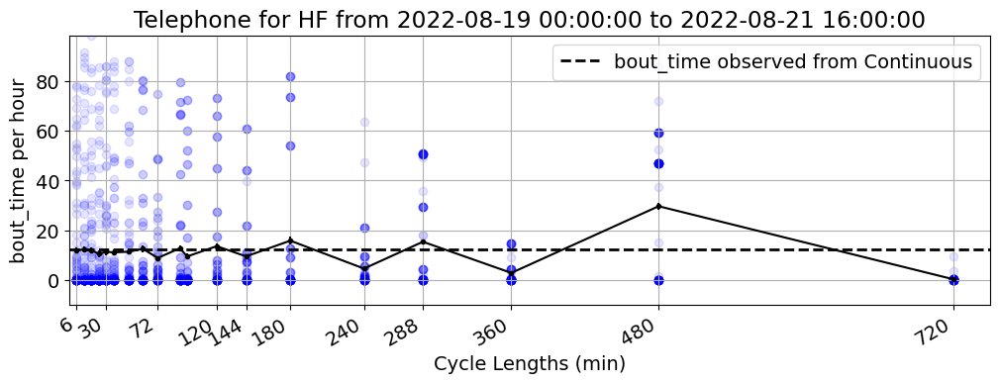

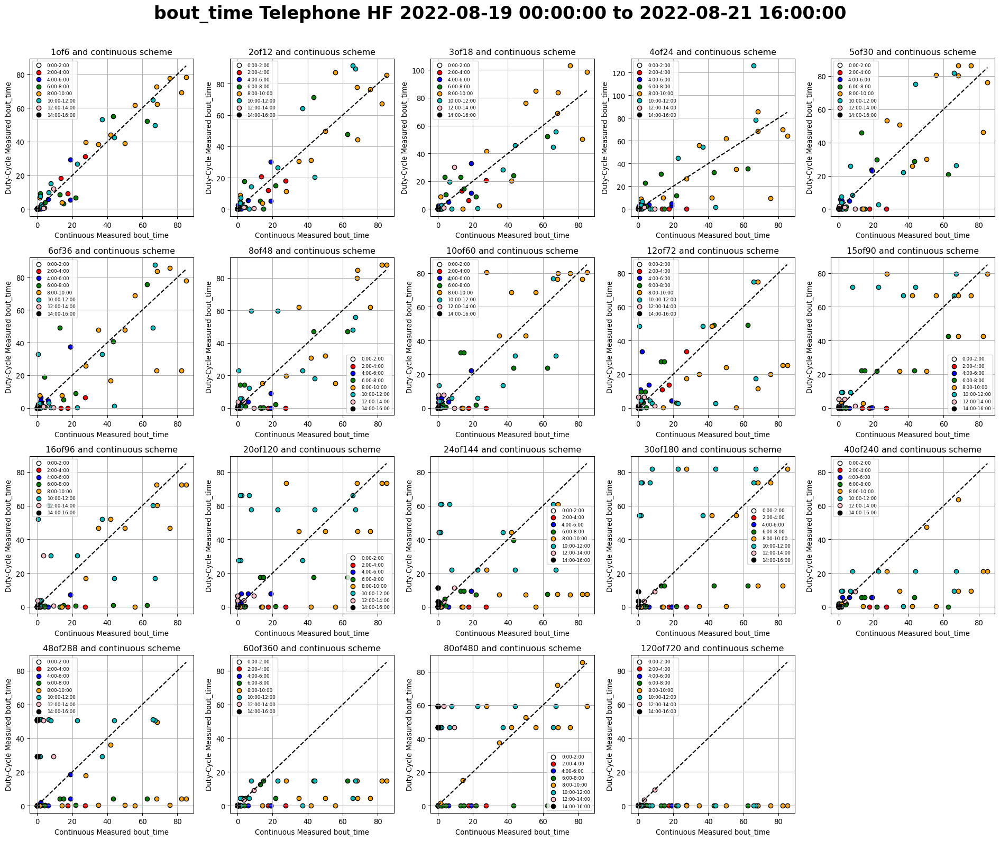

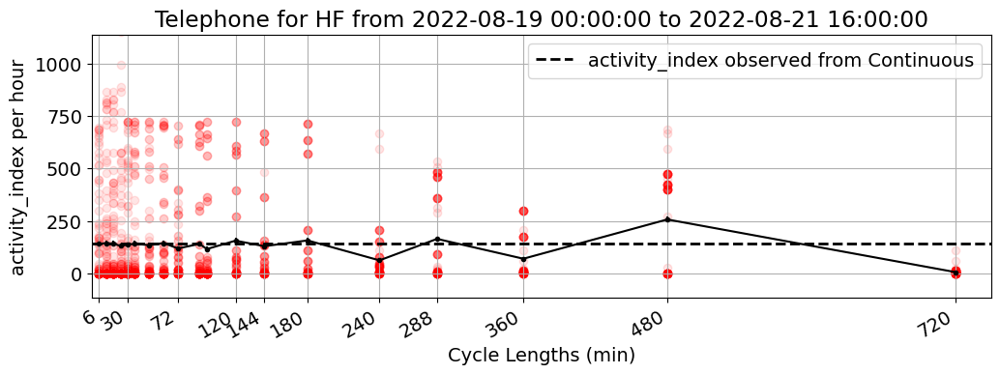

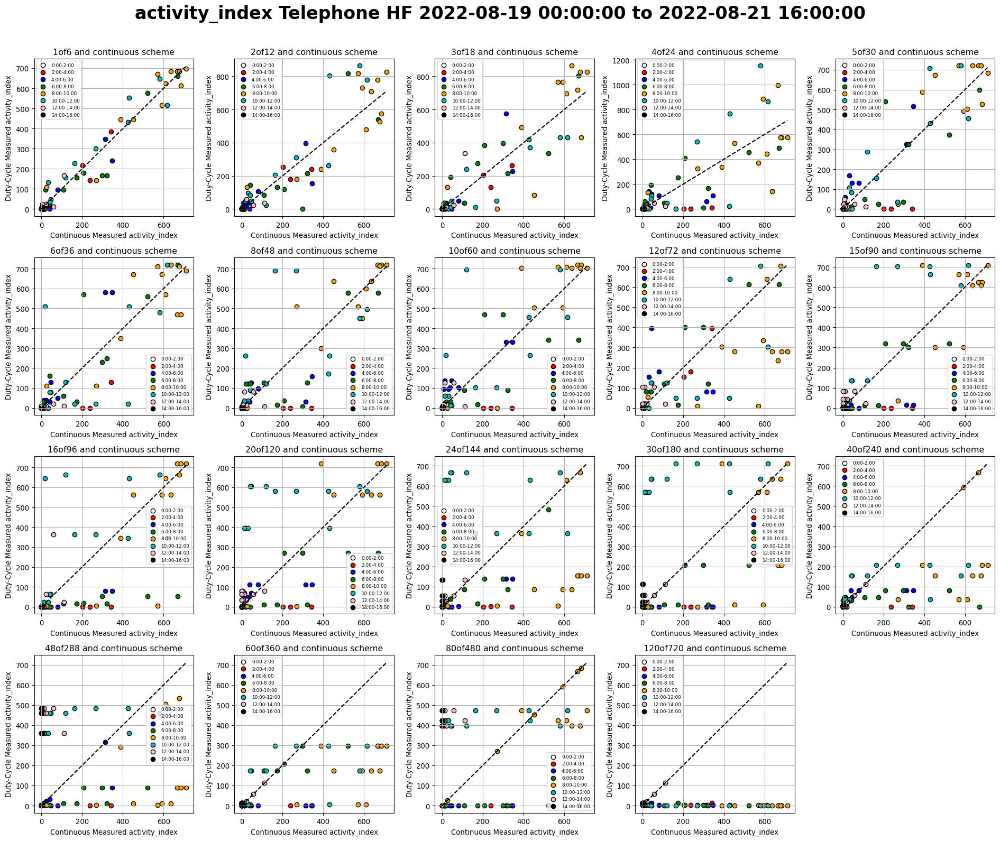

In [12]:
site_key = 'Telephone'
type_keys = ['LF', 'HF']
data_params['bin_size'] = '30'
data_params["dc_tags"] = dc_tags
data_params["site_tag"] = site_key
data_params['cur_dc_tag'] = '30of30'
data_params["site_name"] = SITE_NAMES[site_key]

for type_key in type_keys:
    print(site_key, type_key)
    data_params["type_tag"] = type_key

    file_paths = get_file_paths(data_params)
    data_params['metric_tag'] = 'num_dets'
    activity_dets_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_dets_TYPE_SITE_summary"]}.csv', index_col=0)
    activity_dets_arr.index = pd.DatetimeIndex(activity_dets_arr.index)
    data_params['start'] = dt.datetime(2022, 8, 19, 0, 0, 0)
    data_params['end'] = dt.datetime(2022, 8, 21, 16, 0, 0)
    actvt_metric = activity_dets_arr.loc[data_params['start']:data_params['end']].copy()
    metrics = get_desired_metrics_from_activity_section(actvt_metric, data_params)
    plot_metric_over_cycle_lengths(metrics, data_params)
    plot_metric_subplot_correlation(metrics)

    data_params['metric_tag'] = 'bout_time'
    activity_bout_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_bouts_TYPE_SITE_summary"]}.csv', index_col=0)
    activity_bout_arr.index = pd.DatetimeIndex(activity_bout_arr.index)
    actvt_metric = activity_bout_arr.loc[data_params['start']:data_params['end']].copy()
    metrics = get_desired_metrics_from_activity_section(actvt_metric, data_params)
    plot_metric_over_cycle_lengths(metrics, data_params)
    plot_metric_subplot_correlation(metrics)

    data_params['metric_tag'] = 'activity_index'
    activity_inds_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_inds_TYPE_SITE_summary"]}.csv', index_col=0)
    activity_inds_arr.index = pd.DatetimeIndex(activity_inds_arr.index)
    actvt_metric = activity_inds_arr.loc[data_params['start']:data_params['end']].copy()
    metrics = get_desired_metrics_from_activity_section(actvt_metric, data_params)
    plot_metric_over_cycle_lengths(metrics, data_params)
    plot_metric_subplot_correlation(metrics)

In [13]:
activity_dets_arr = pd.read_csv(f'{file_paths["duty_cycled_folder"]}/{file_paths["dc_dets_TYPE_SITE_summary"]}.csv', index_col=0)
activity_dets_arr.index = pd.DatetimeIndex(activity_dets_arr.index)
actvt_metric = activity_dets_arr.loc[data_params['start']:data_params['end']].copy()
metr = pd.DataFrame(actvt_metric.iloc[:,0])
metr_p = pd.pivot_table(metr, index=(metr.index.time), 
                    columns=metr.index.date, 
                    values=metr.columns[0])
metr_p

,2022-08-19,2022-08-20,2022-08-21
00:00:00,NaN,0.0,0.0
00:30:00,NaN,0.0,0.0
01:00:00,0.0,0.0,0.0
01:30:00,1.0,0.0,0.0
02:00:00,0.0,1.0,0.0
02:30:00,0.0,0.0,0.0
03:00:00,0.0,0.0,0.0
03:30:00,1463.0,1686.0,2546.0
04:00:00,124.0,626.0,202.0
04:30:00,57.0,199.0,28.0
